# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import scanpy as sc
from collections import defaultdict

import matplotlib
from matplotlib.pyplot import rcParams
import matplotlib.pyplot as plt

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [23]:
import os

import scanpy as sc
import numpy as np
from pathlib import Path
from sklearn.feature_selection import mutual_info_classif
from scipy import stats

from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import min_weight_full_bipartite_matching

import drvi
from drvi.utils.metrics import DiscreteDisentanglementBenchmark
from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.method_info import pretify_method_name
from drvi_notebooks.utils.plotting import plot_per_latent_scatter, scatter_plot_per_latent

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


In [125]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

# Config

In [7]:
cwd = os.getcwd()

In [8]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [9]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [10]:
output_dir = proj_dir / 'plots' / 'crispr_screen_norman'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/crispr_screen_norman')

In [11]:
run_name = 'norman_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
def set_font_in_rc_params():
    fs = 16
    plt.rcParams.update({
        'font.size': fs,            # General font size
        'axes.titlesize': fs,      # Title font size
        'axes.labelsize': fs,      # Axis label font size
        'legend.fontsize': fs,    # Legend font size
        'xtick.labelsize': fs,      # X-axis tick label font size
        'ytick.labelsize': fs       # Y-axis tick label font size
    })

## Data

In [14]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 104339 × 5000
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', 'g

## Runs to load

In [15]:
run_info = get_run_info_for_dataset('norman_hvg')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [16]:
embeds = {}
methods_to_consider = ["DRVI", "DRVI-IK", "scVI", "scETM", "MOFA", "LIGER", "PCA", "ICA", "MICHIGAN-opt", "TCVAE-opt", "scVI-PCA", "scVI-ICA"]

random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    if method_name not in methods_to_consider:
        continue
    print(method_name)
    if str(run_path).endswith(".h5ad"):
        embed = sc.read(run_path)
    else:
        embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
DRVI-IK
scVI
scVI-PCA
scVI-ICA
PCA
ICA
MOFA
TCVAE-opt
MICHIGAN-opt
LIGER
scETM


INFO     File                                                                                                      
         /home/icb/amirali.moinfar/workspace/train_logs/models/drvi_20240510-155340-528650/model.pt/v_0_1_0_model.p
         t already downloaded                                                                                      


CUDA backend failed to initialize: Found CUDA version 12010, but JAX was built against version 12020, which is newer. The copy of CUDA that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


INFO     DRVI: The model has been initialized                                                                      


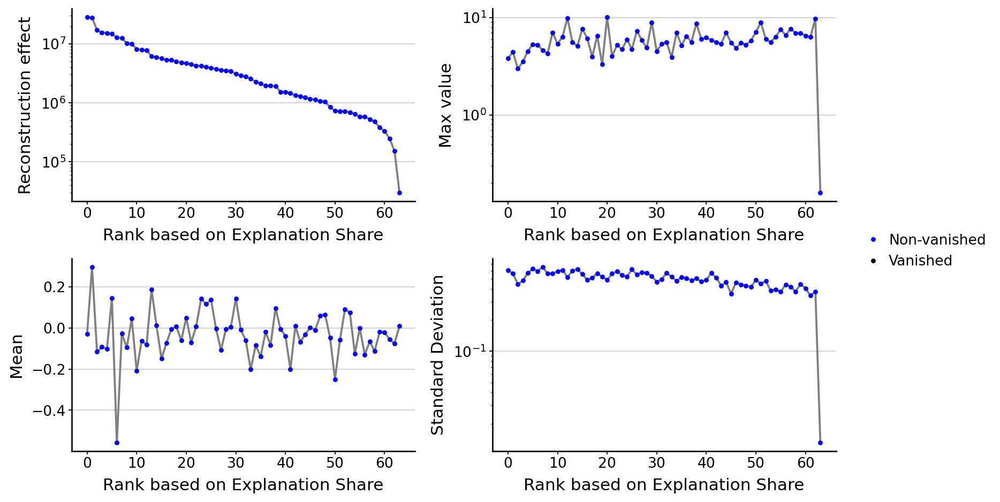

In [19]:
embed_drvi = embeds['DRVI']
model_drvi = drvi.model.DRVI.load(RUNS_TO_LOAD['DRVI'] / 'model.pt', adata, prefix='v_0_1_0_')
adata.obsm['X_umap_drvi'] = embed_drvi[adata.obs.index].obsm['X_umap']

drvi.utils.tl.set_latent_dimension_stats(model_drvi, embed_drvi)
drvi.utils.pl.plot_latent_dimension_stats(embed_drvi, ncols=2)

# Comparison of scatterplots and MI

In [20]:
benchmark_results = {}
for method_name, run_path in RUNS_TO_LOAD.items():
    version = DiscreteDisentanglementBenchmark.version
    if str(RUNS_TO_LOAD[method_name]).endswith('.h5ad'):
        bench_filename = Path(str(RUNS_TO_LOAD[method_name])[:-len('.h5ad')] + f'_DR_benchmark_on_{cell_type_key}_{version}.pkl')
    else:
        bench_filename = RUNS_TO_LOAD[method_name] / f'DR_benchmark_on_{cell_type_key}_{version}.pkl'
    bench = DiscreteDisentanglementBenchmark.load(bench_filename, embed.X, discrete_target=embed.obs[cell_type_key], one_hot_target=None)
    benchmark_results[method_name] = bench.get_results_details()

 p1_cts ['KLF1', 'KLF1+MAP2K6', 'FOXA1+KLF1', 'CEBPE+KLF1', 'COL2A1+KLF1', 'AHR+KLF1', 'BAK1+KLF1', 'DUSP9+KLF1', 'CLDN6+KLF1', 'KLF1+TGFBR2', 'CEBPA+KLF1', 'KLF1+SET'] 
 p2_cts ['SET', 'CEBPE+SET', 'IRF1+SET', 'RHOXF2+SET', 'KLF1+SET']
DRVI
plotting Dim 59, Dim 29


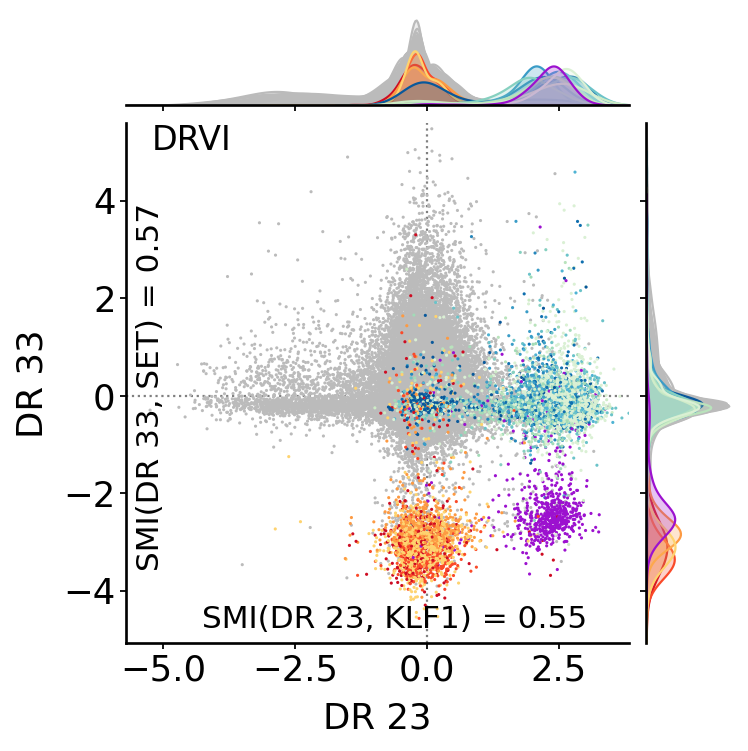

End of latent plots
DRVI-IK
plotting Dim 32, Dim 33


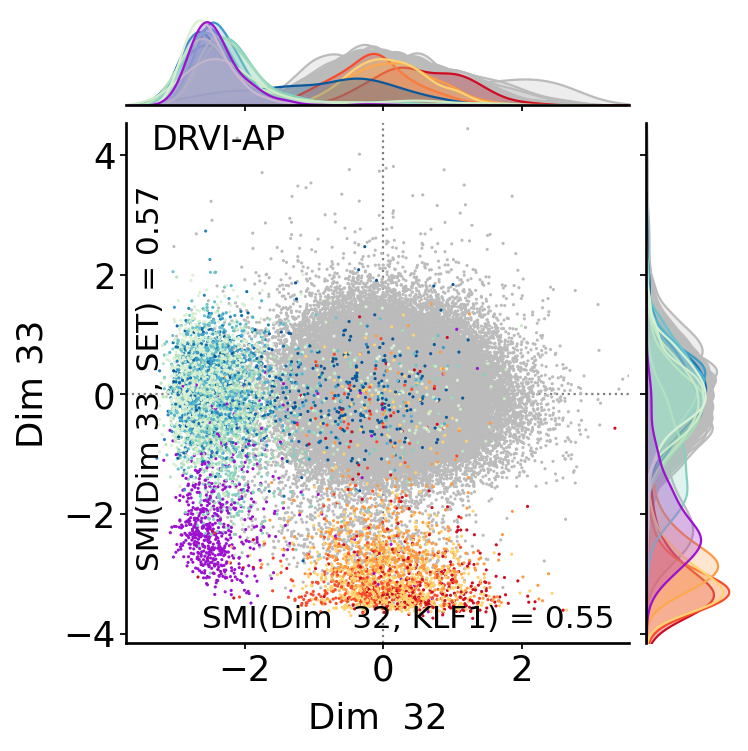

End of latent plots
scVI
plotting Dim 39, Dim 19


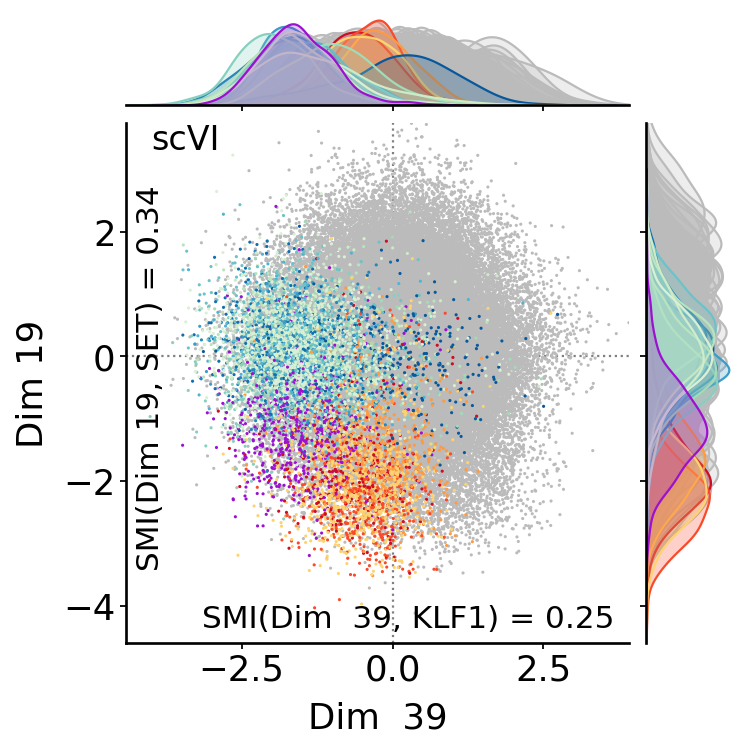

End of latent plots
scVI-PCA
plotting Dim 5, Dim 3


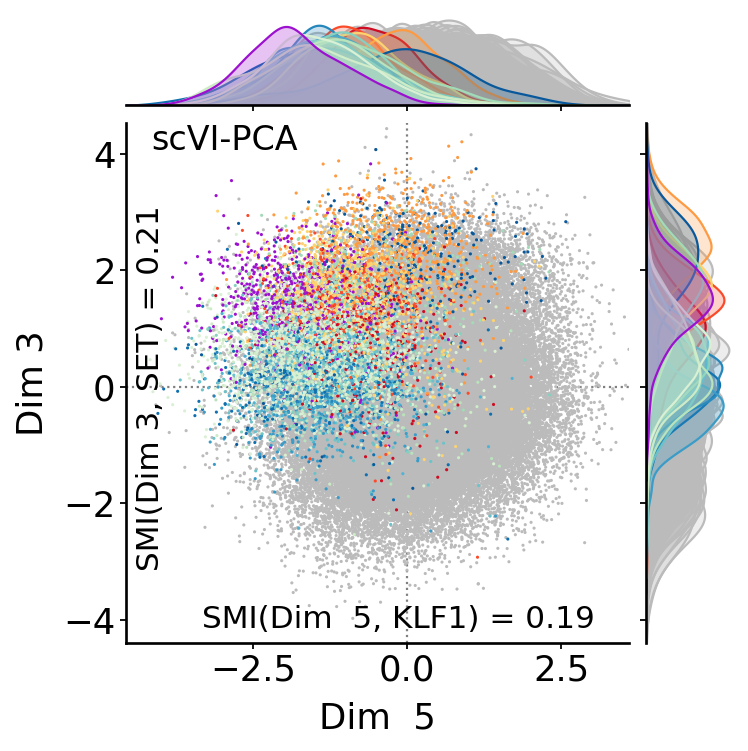

End of latent plots
scVI-ICA
plotting Dim 51, Dim 26


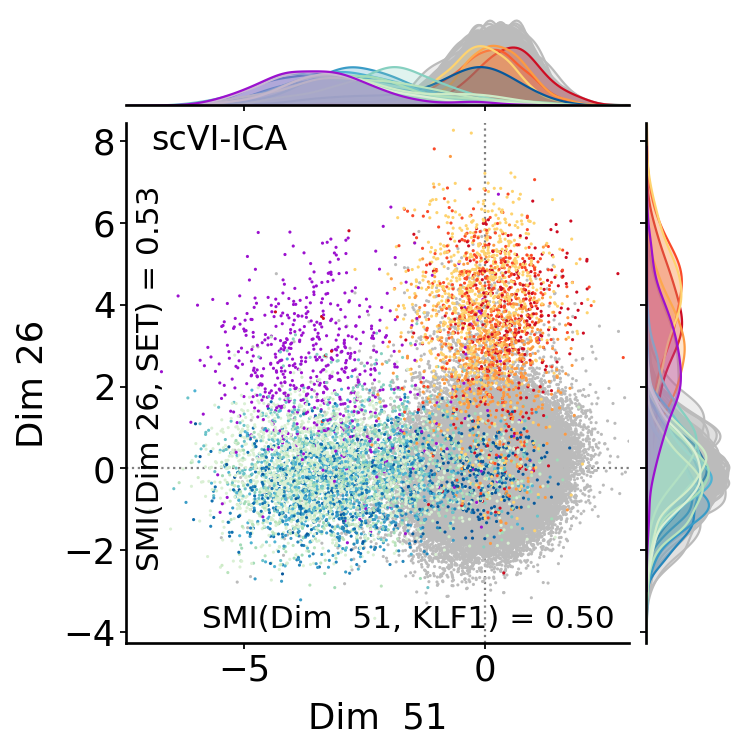

End of latent plots
PCA
plotting Dim 12, Dim 17


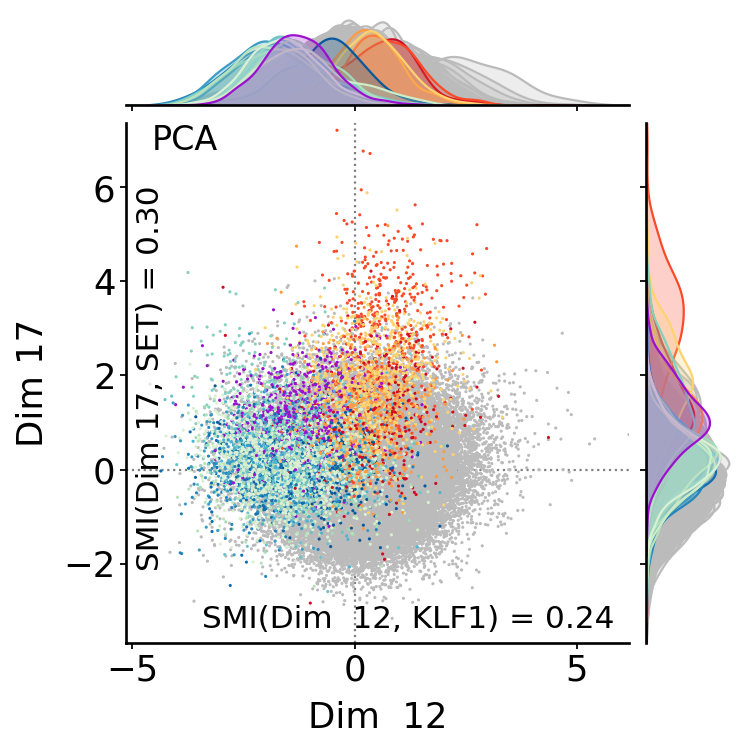

End of latent plots
ICA
plotting Dim 61, Dim 58


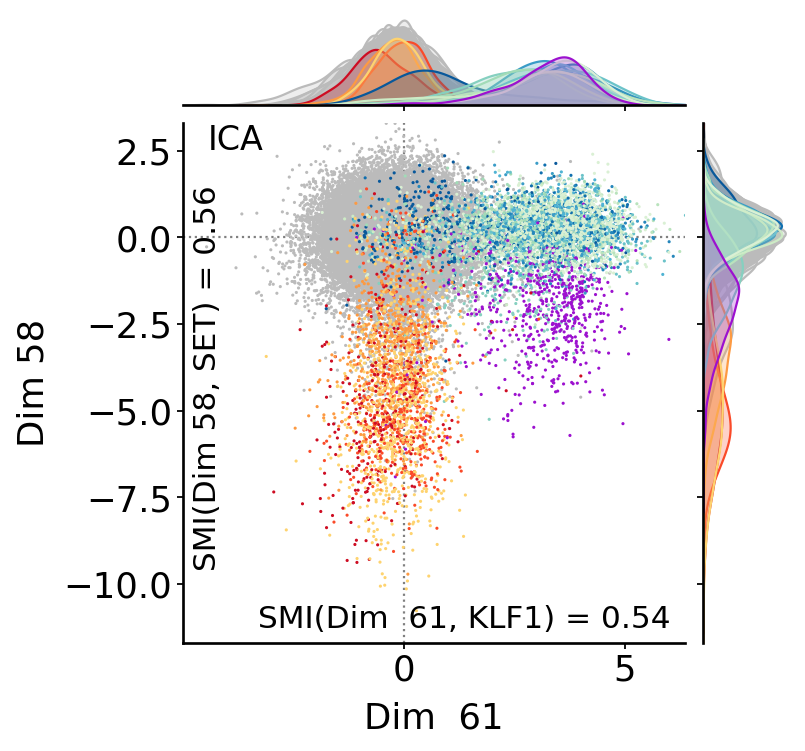

End of latent plots
MOFA
plotting Dim 13, Dim 18


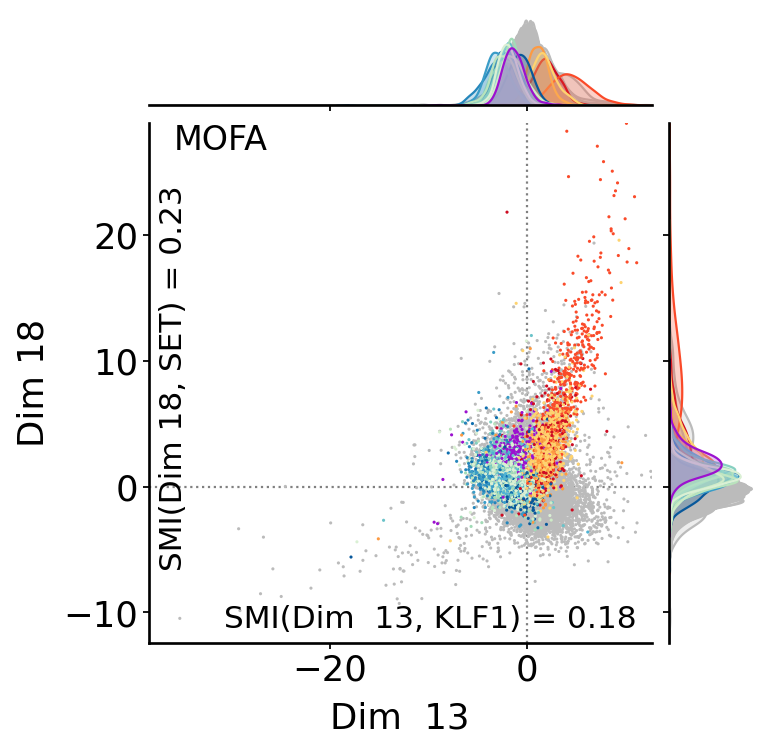

End of latent plots
TCVAE-opt
plotting Dim 31, Dim 41


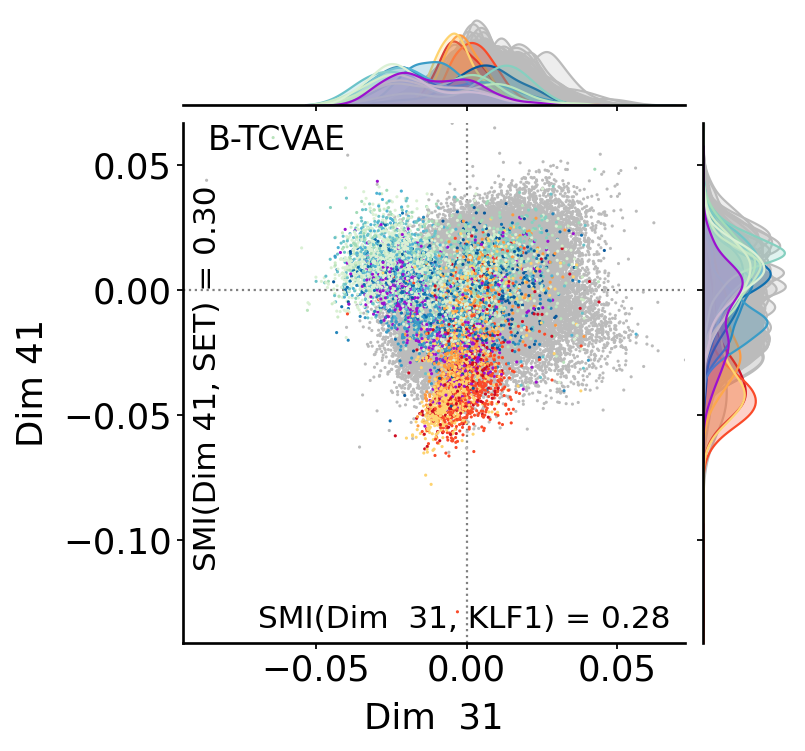

End of latent plots
MICHIGAN-opt
plotting Dim 36, Dim 4


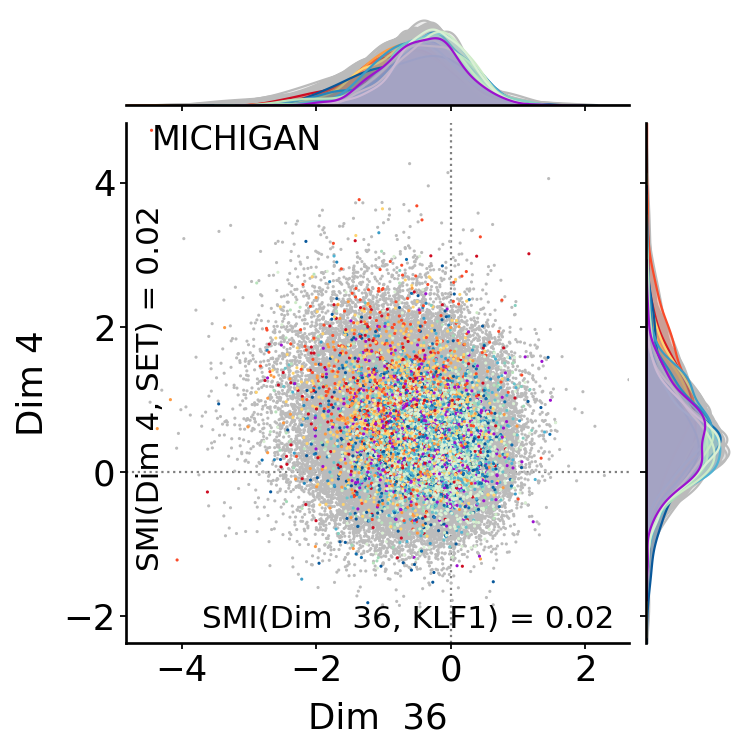

End of latent plots
LIGER
plotting Dim 41, Dim 10


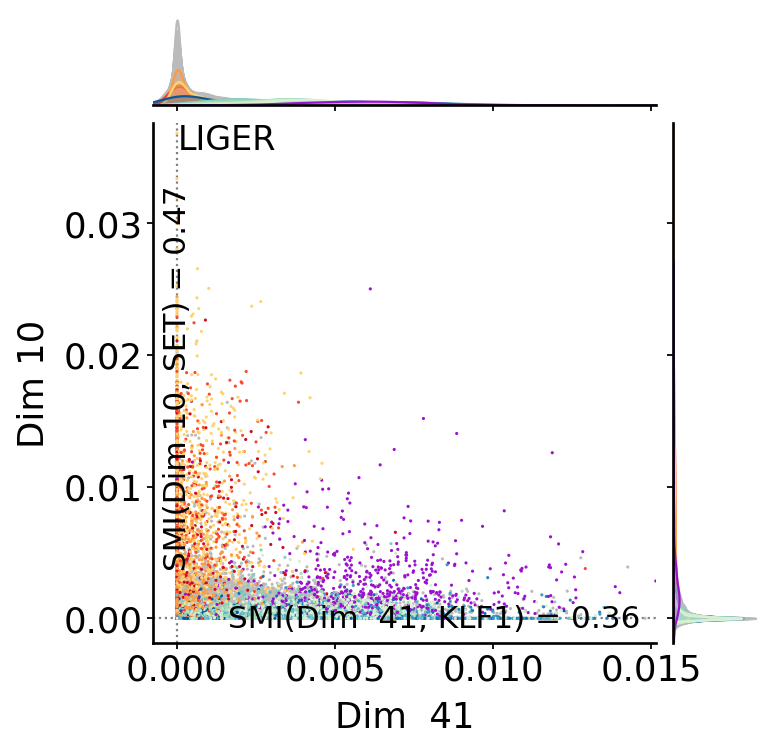

End of latent plots
scETM
plotting Dim 42, Dim 36


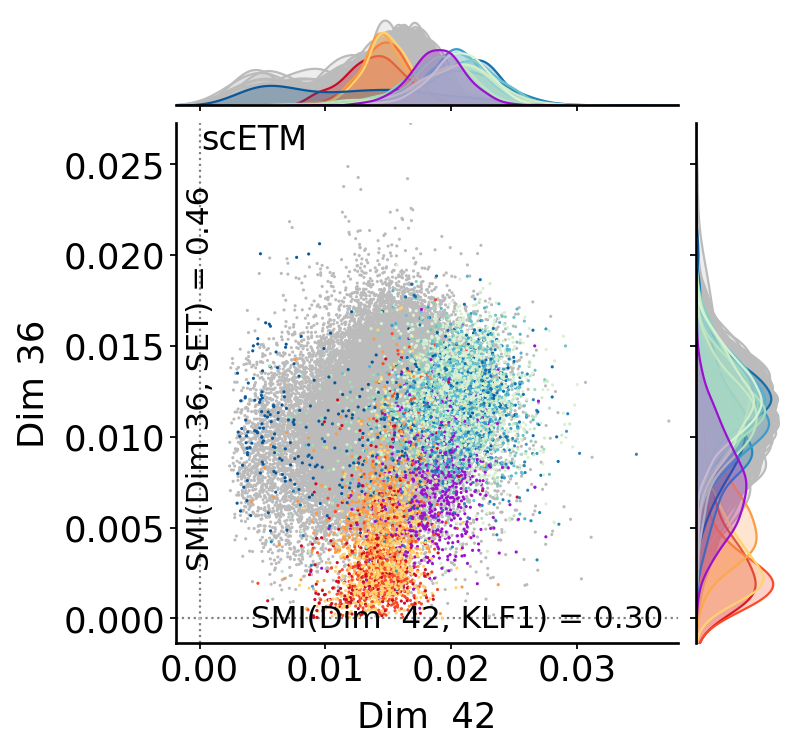

End of latent plots
plotting Dim 42, Dim 36


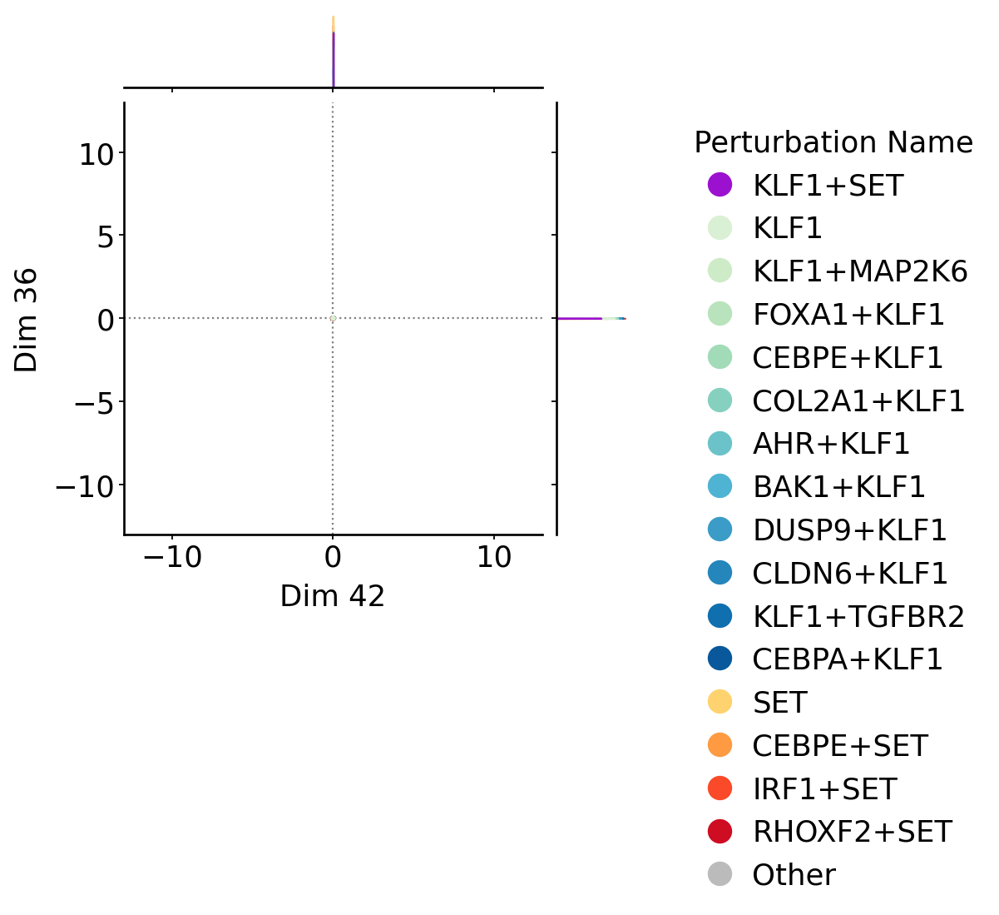

End of latent plots
 p1_cts ['DUSP9', 'DUSP9+MAPK1', 'DUSP9+ETS2', 'DUSP9+PRTG', 'DUSP9+IGDCC3', 'DUSP9+KLF1', 'DUSP9+SNAI1'] 
 p2_cts ['SET', 'CEBPE+SET', 'KLF1+SET', 'IRF1+SET', 'RHOXF2+SET']
DRVI
plotting Dim 45, Dim 29


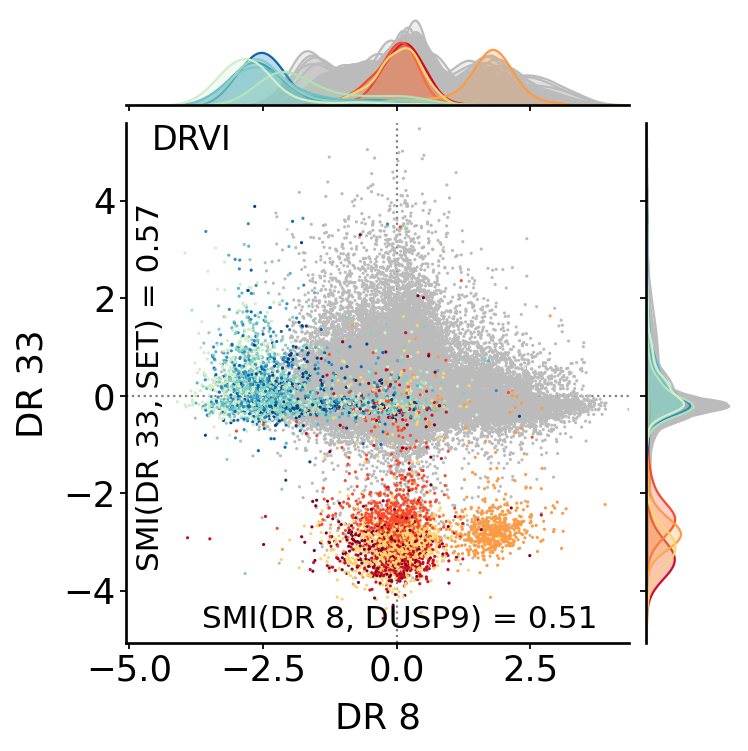

End of latent plots
DRVI-IK
plotting Dim 5, Dim 33


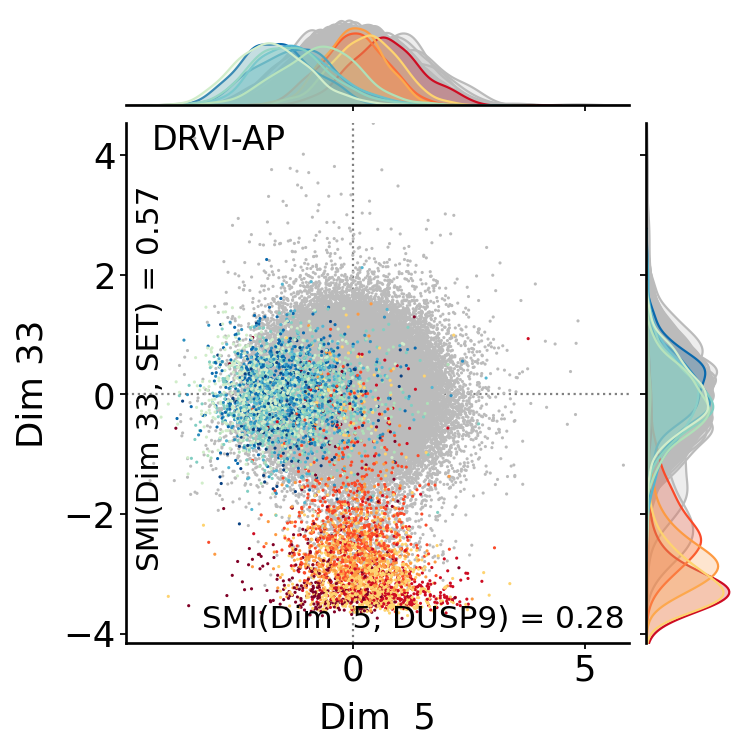

End of latent plots
scVI
plotting Dim 21, Dim 19


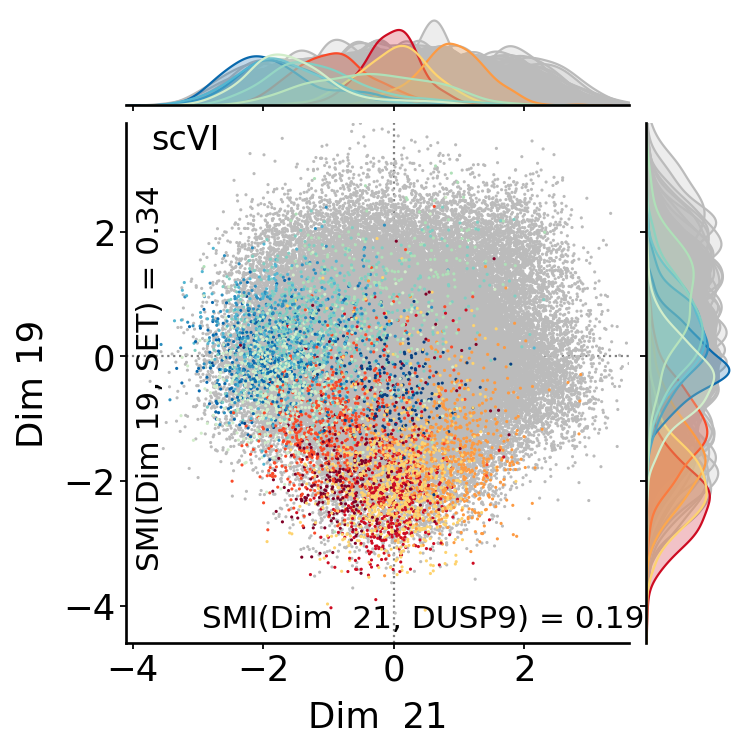

End of latent plots
scVI-PCA
plotting Dim 44, Dim 3


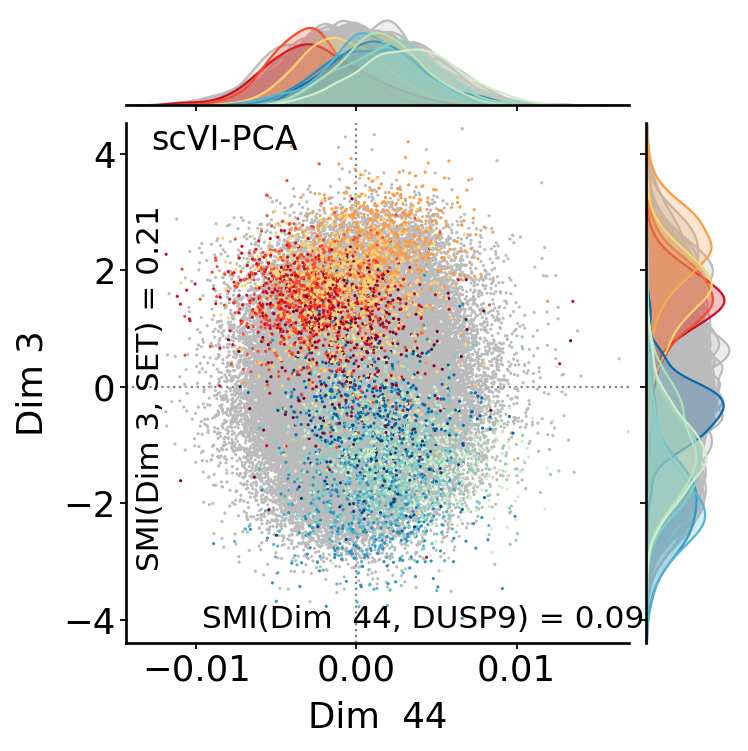

End of latent plots
scVI-ICA
plotting Dim 19, Dim 26


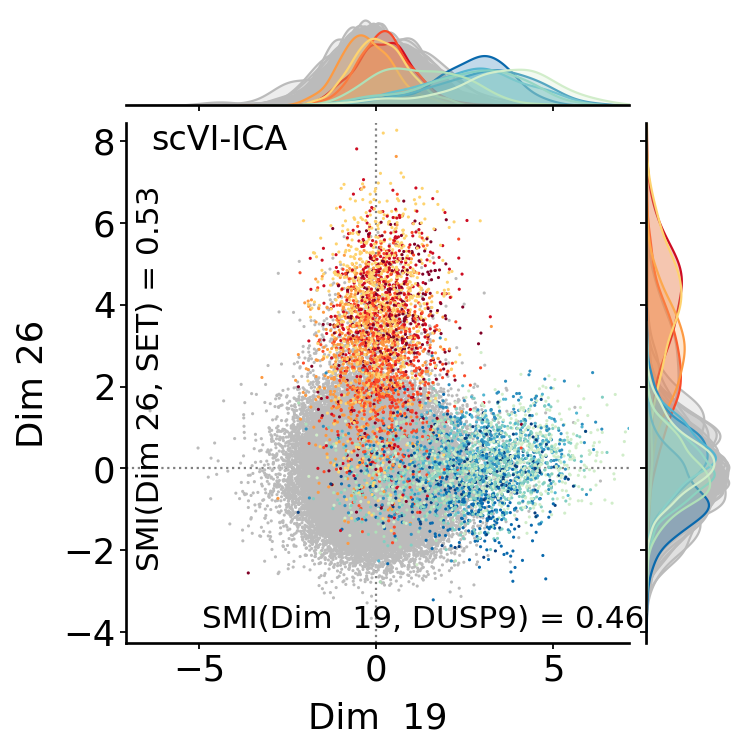

End of latent plots
PCA
plotting Dim 2, Dim 17


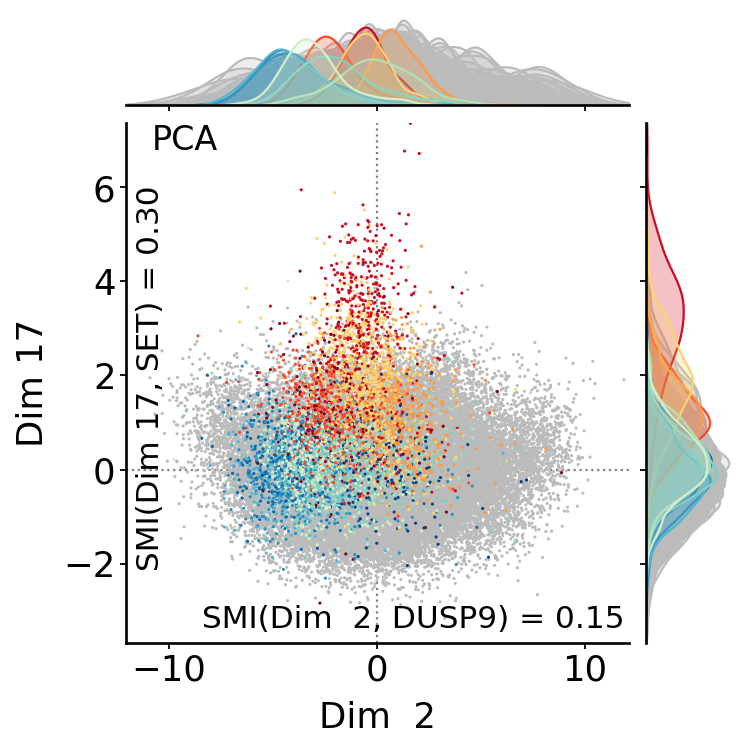

End of latent plots
ICA
plotting Dim 31, Dim 58


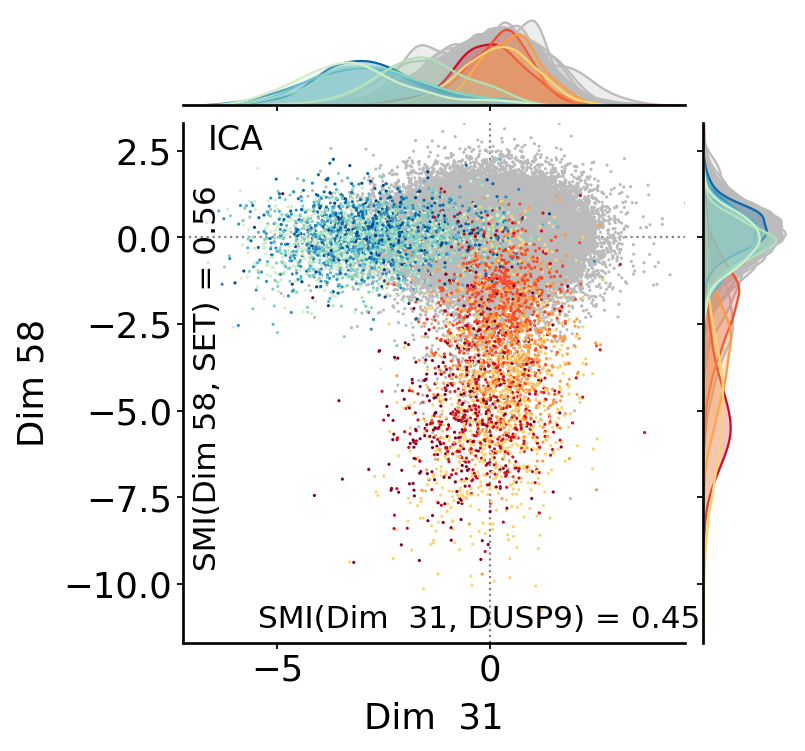

End of latent plots
MOFA
plotting Dim 2, Dim 18


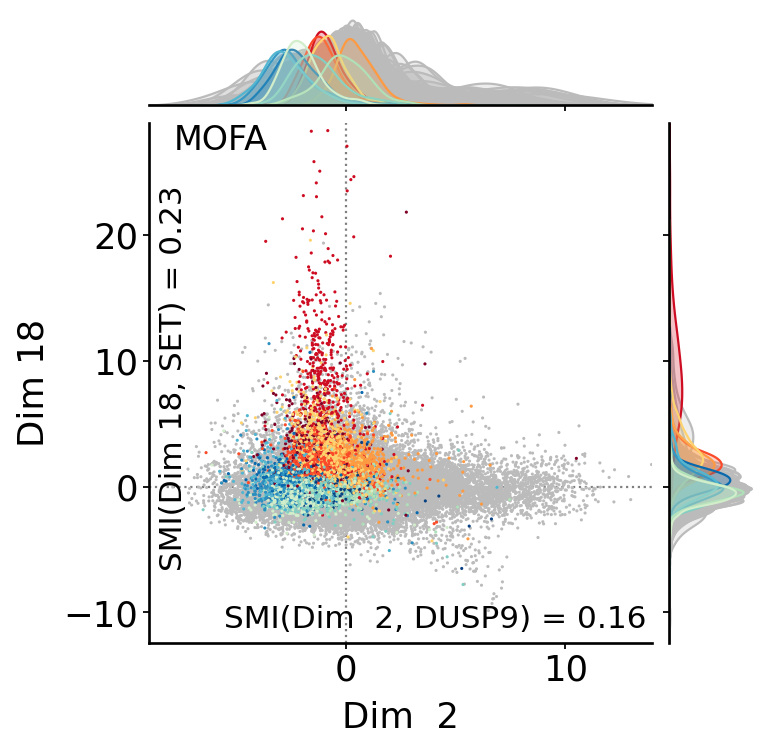

End of latent plots
TCVAE-opt
plotting Dim 58, Dim 41


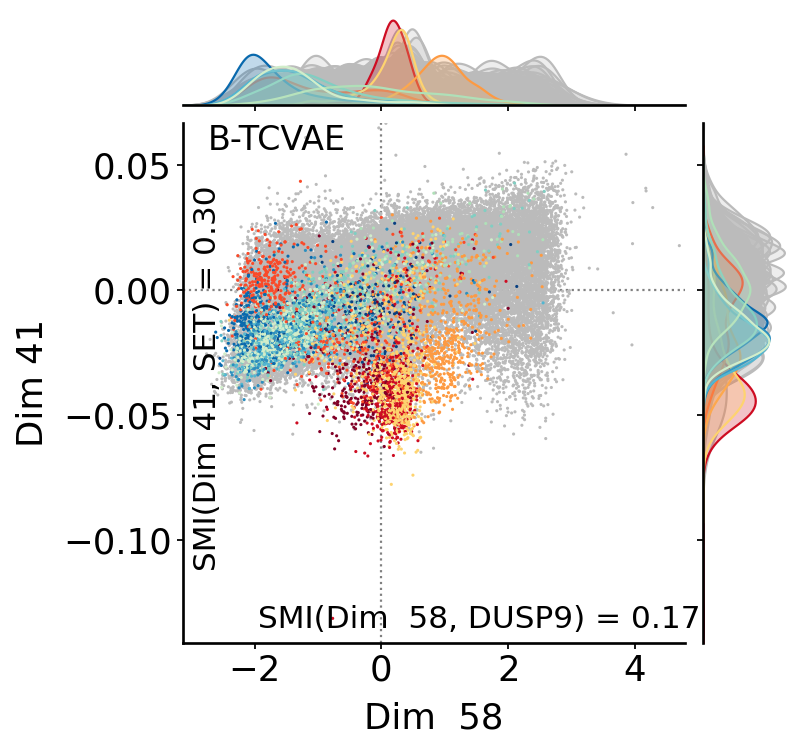

End of latent plots
MICHIGAN-opt
plotting Dim 4, Dim 35


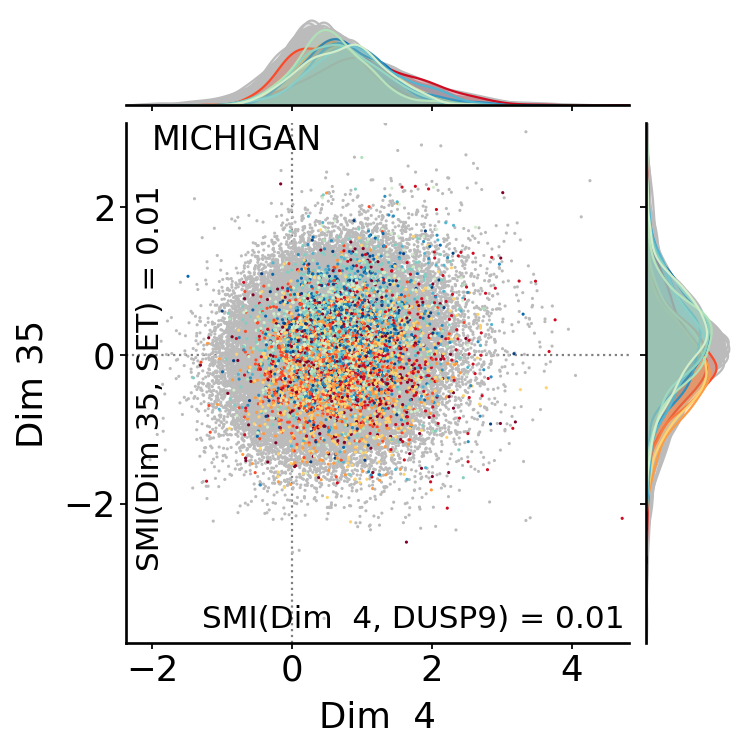

End of latent plots
LIGER
plotting Dim 54, Dim 10


IOStream.flush timed out


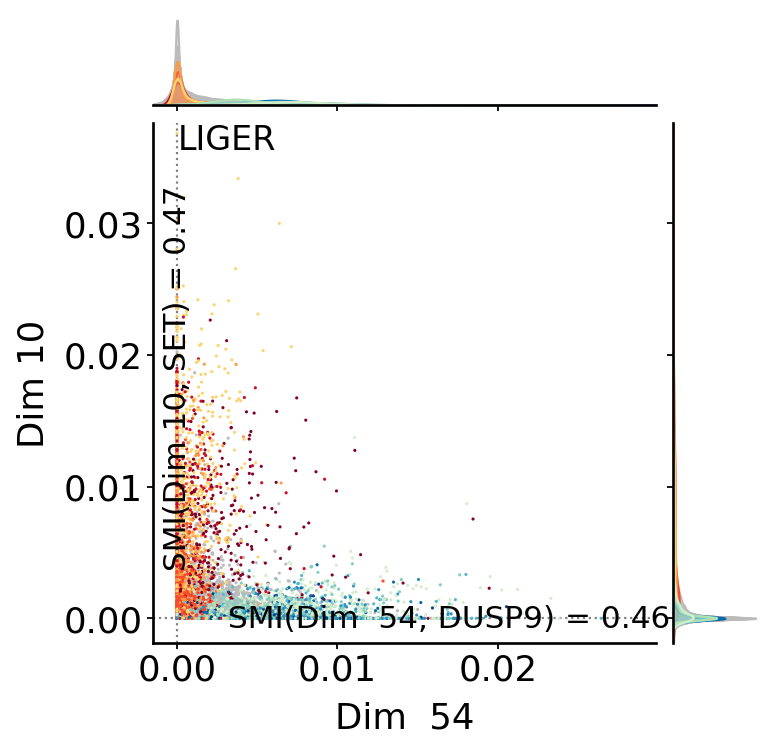

End of latent plots
scETM
plotting Dim 50, Dim 36


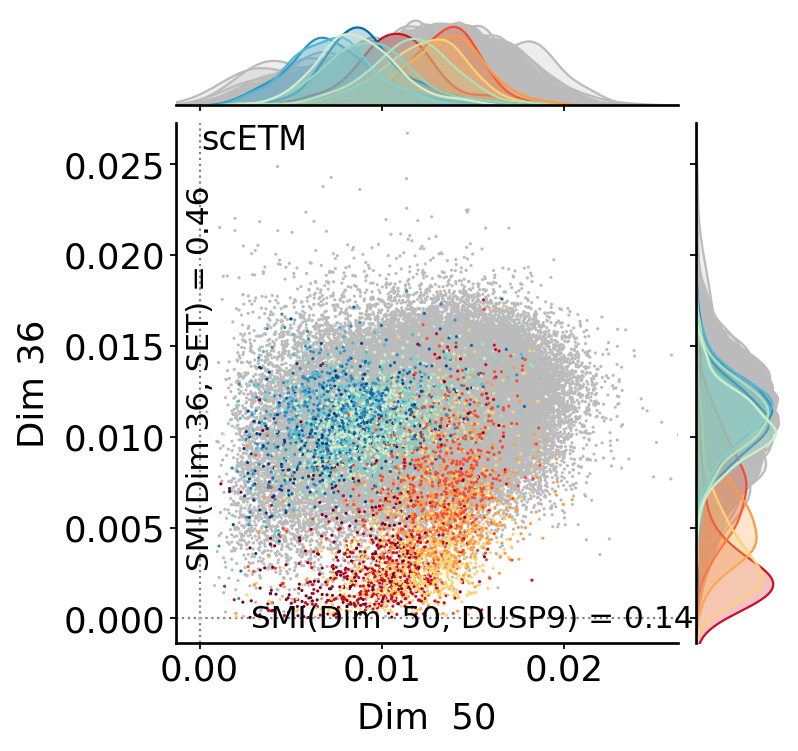

End of latent plots
plotting Dim 50, Dim 36


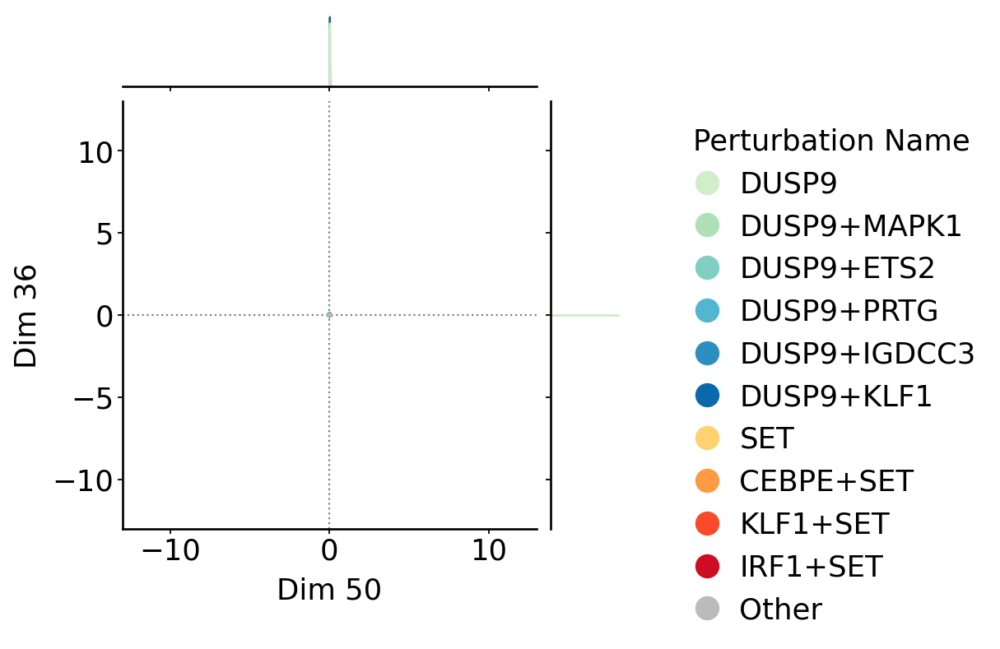

End of latent plots
 p1_cts ['IRF1', 'IRF1+SET'] 
 p2_cts ['SET', 'CEBPE+SET', 'KLF1+SET', 'RHOXF2+SET', 'IRF1+SET']
DRVI
plotting Dim 23, Dim 29


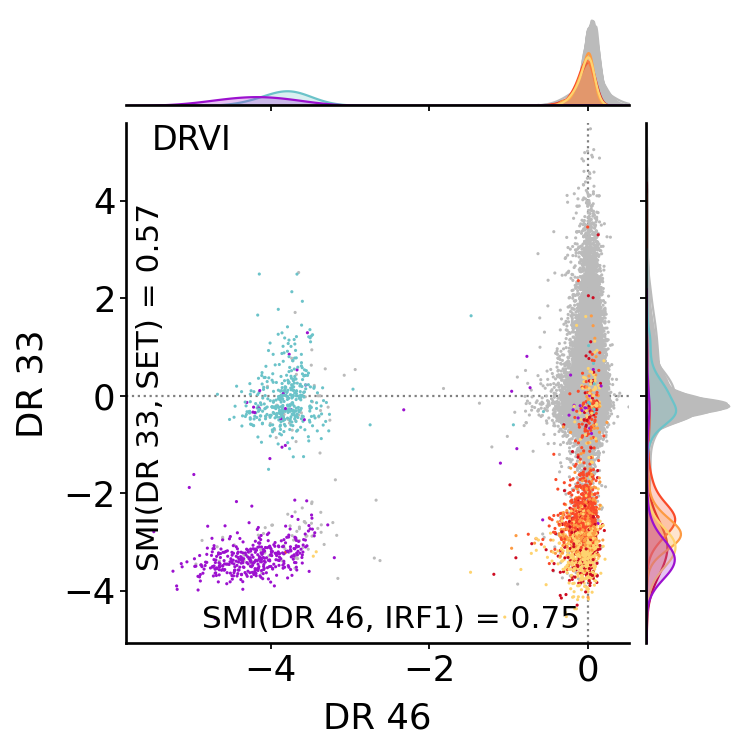

End of latent plots
DRVI-IK
plotting Dim 35, Dim 33


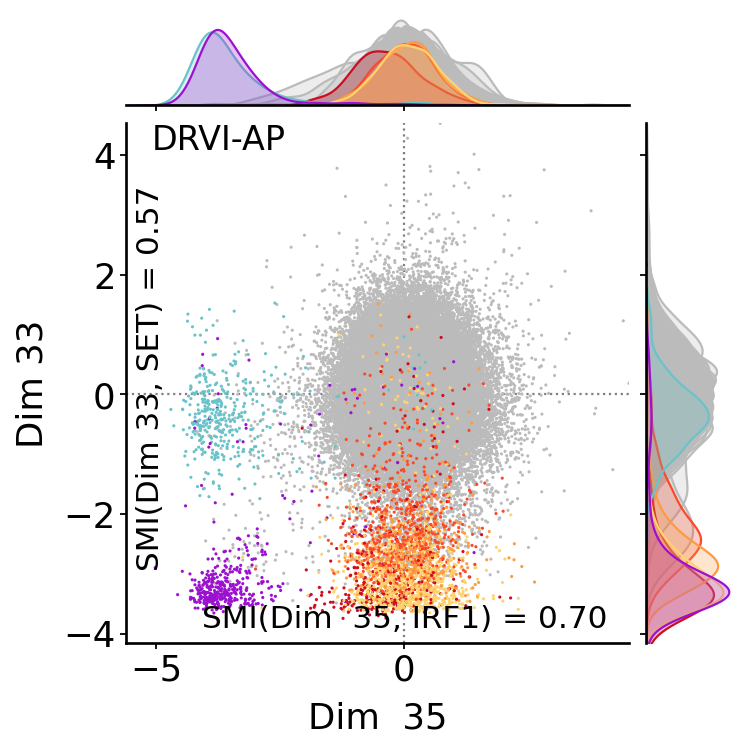

End of latent plots
scVI
plotting Dim 3, Dim 19


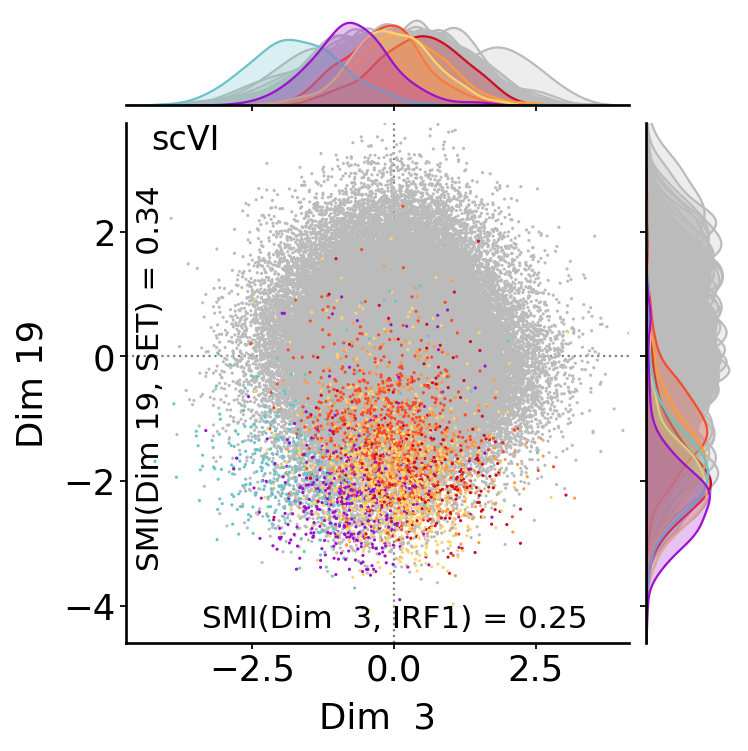

End of latent plots
scVI-PCA
plotting Dim 8, Dim 3


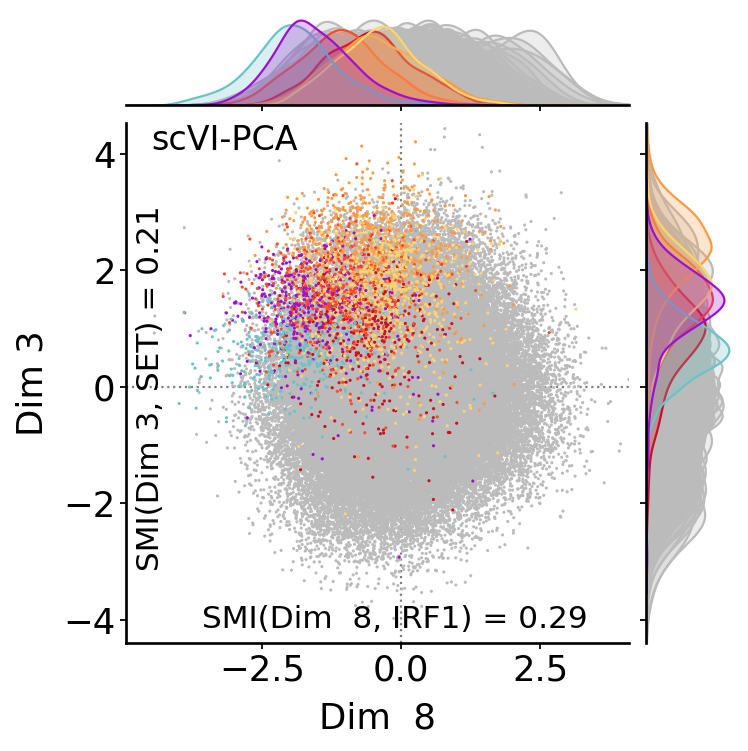

End of latent plots
scVI-ICA
plotting Dim 12, Dim 26


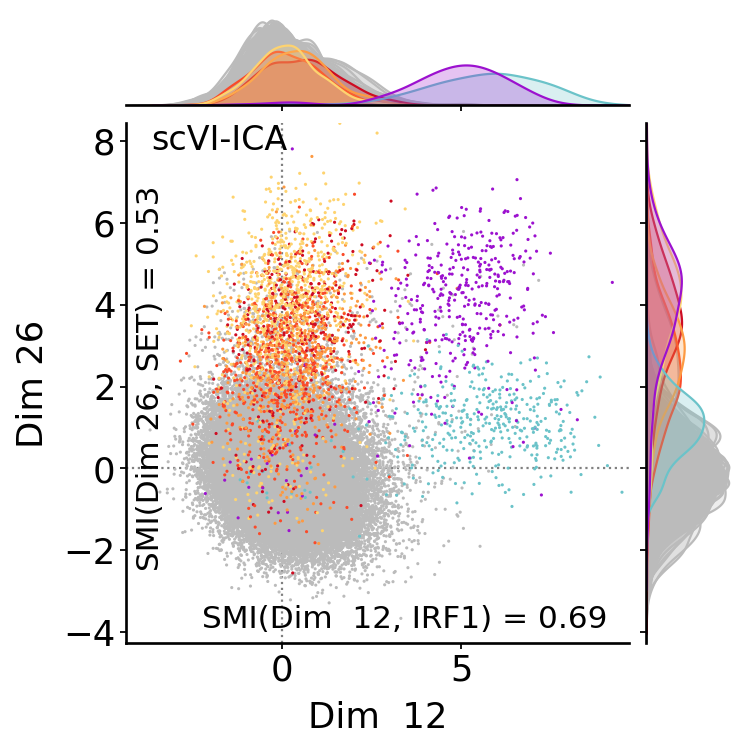

End of latent plots
PCA
plotting Dim 38, Dim 17


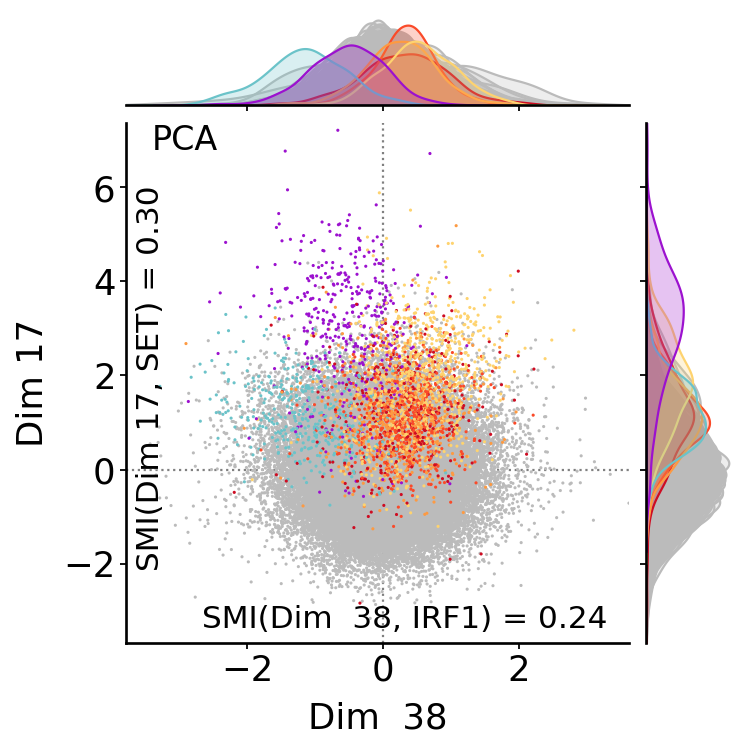

End of latent plots
ICA
plotting Dim 44, Dim 58


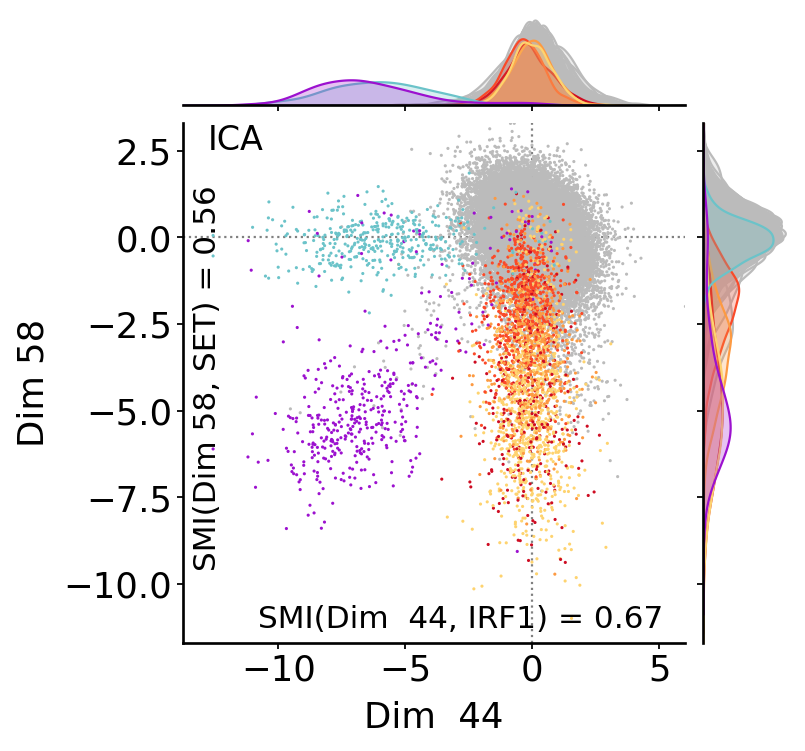

End of latent plots
MOFA
plotting Dim 19, Dim 18


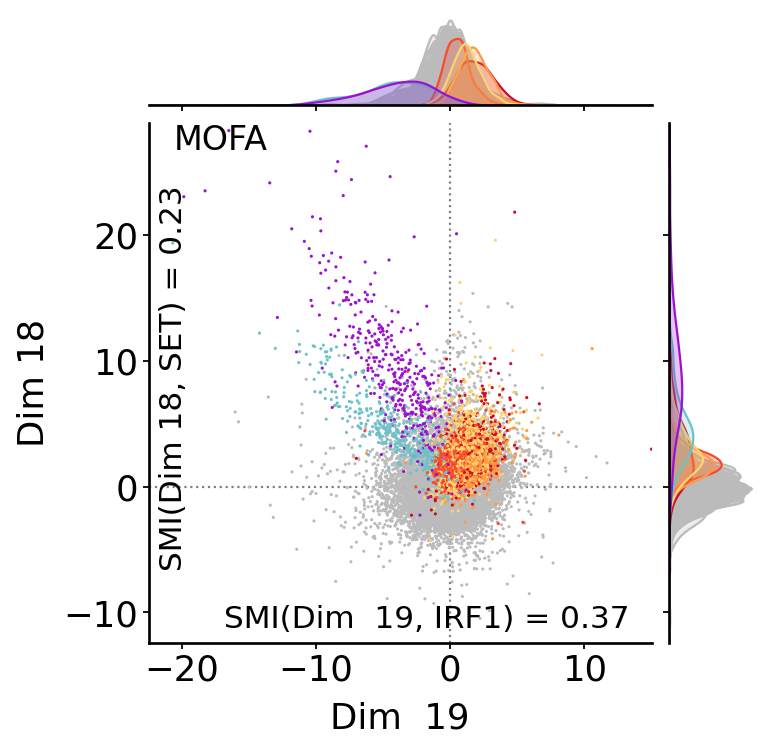

End of latent plots
TCVAE-opt
plotting Dim 61, Dim 41


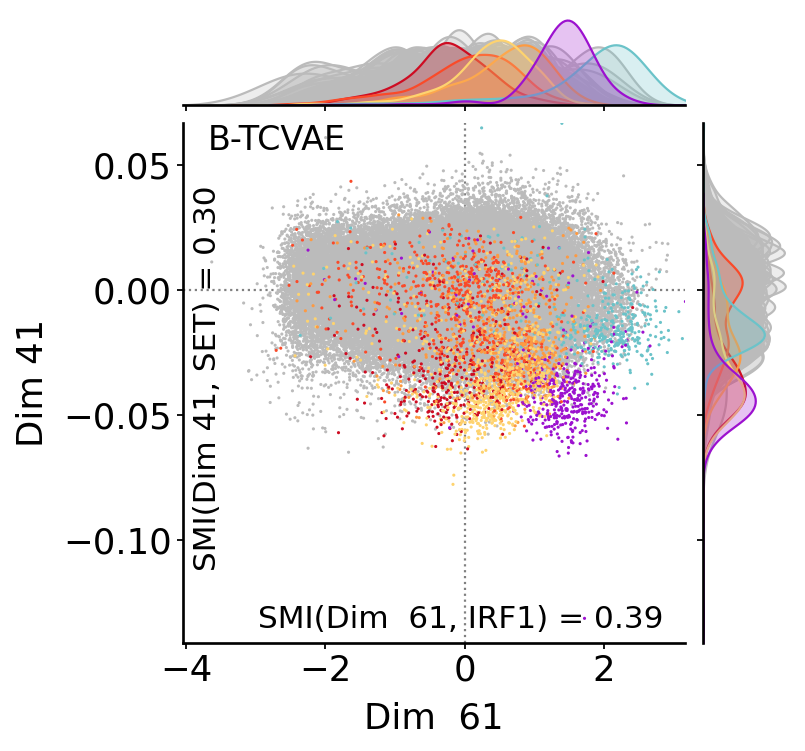

End of latent plots
MICHIGAN-opt
plotting Dim 58, Dim 4


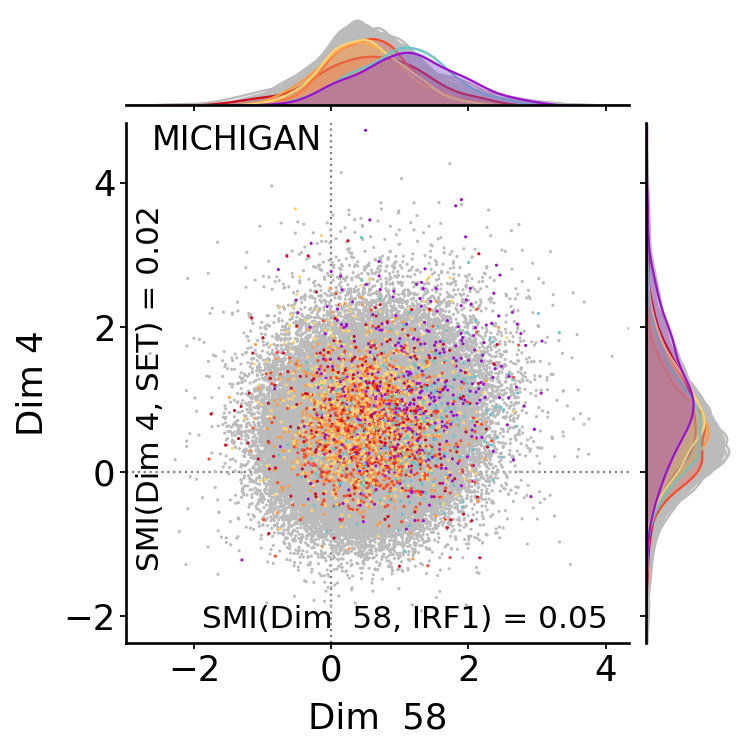

End of latent plots
LIGER
plotting Dim 28, Dim 10


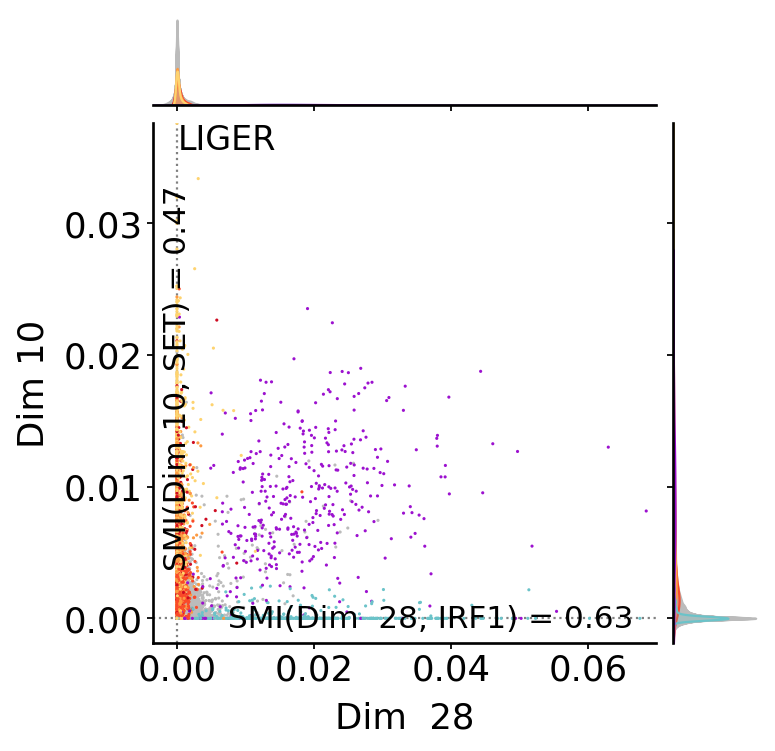

End of latent plots
scETM
plotting Dim 10, Dim 36


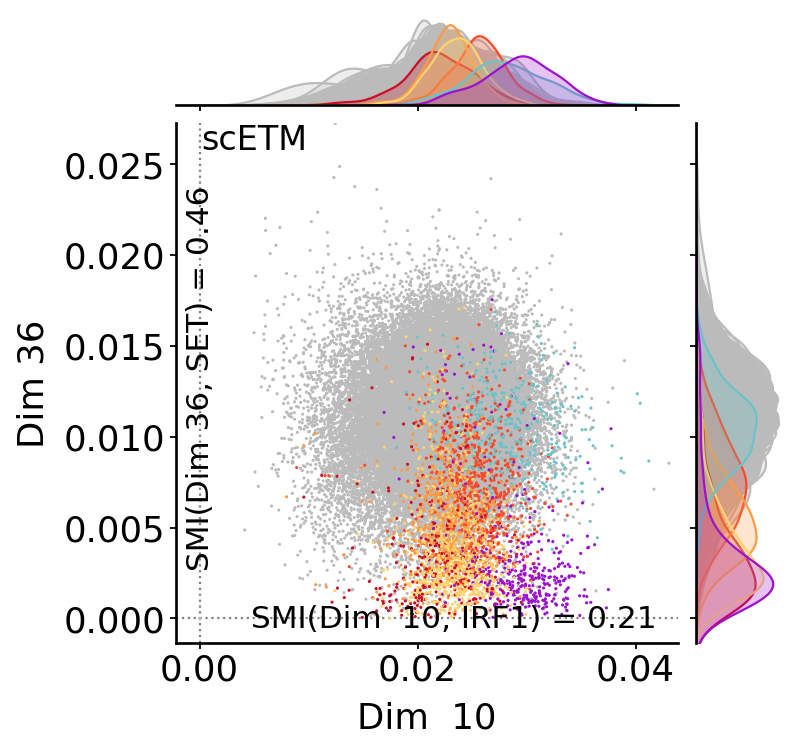

End of latent plots
plotting Dim 10, Dim 36


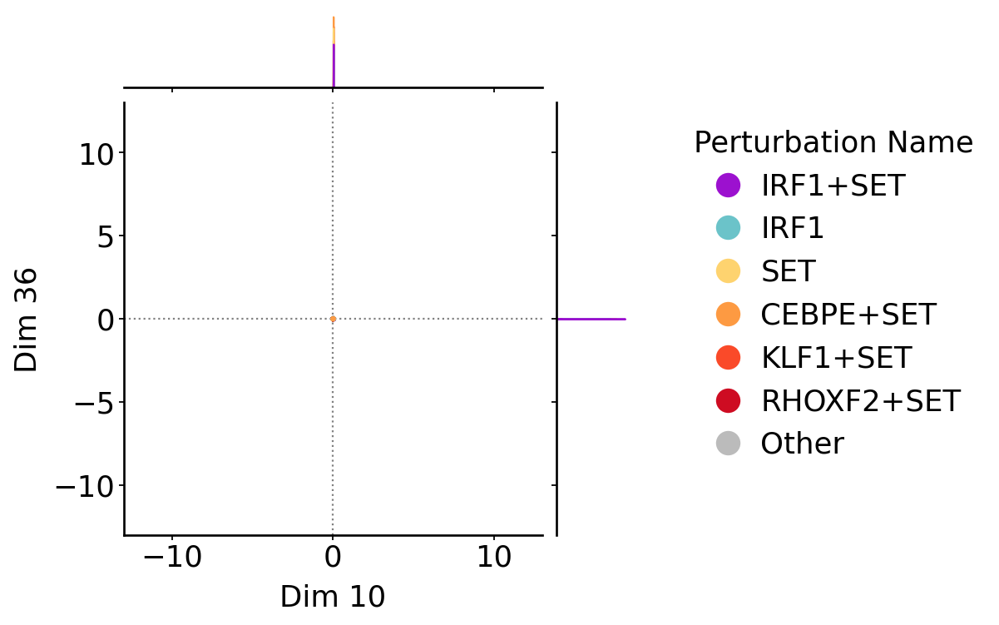

End of latent plots
 p1_cts ['DUSP9', 'DUSP9+MAPK1', 'DUSP9+ETS2', 'DUSP9+PRTG', 'DUSP9+IGDCC3', 'DUSP9+SNAI1', 'DUSP9+KLF1'] 
 p2_cts ['KLF1', 'KLF1+MAP2K6', 'FOXA1+KLF1', 'CEBPE+KLF1', 'COL2A1+KLF1', 'AHR+KLF1', 'KLF1+SET', 'BAK1+KLF1', 'CLDN6+KLF1', 'KLF1+TGFBR2', 'CEBPA+KLF1', 'DUSP9+KLF1']
DRVI
plotting Dim 45, Dim 59


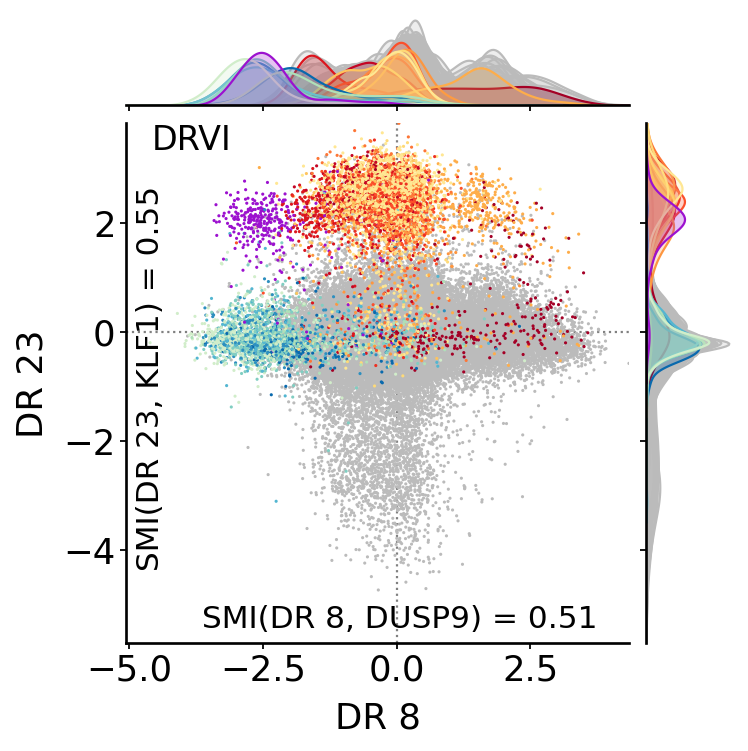

End of latent plots
DRVI-IK
plotting Dim 5, Dim 32


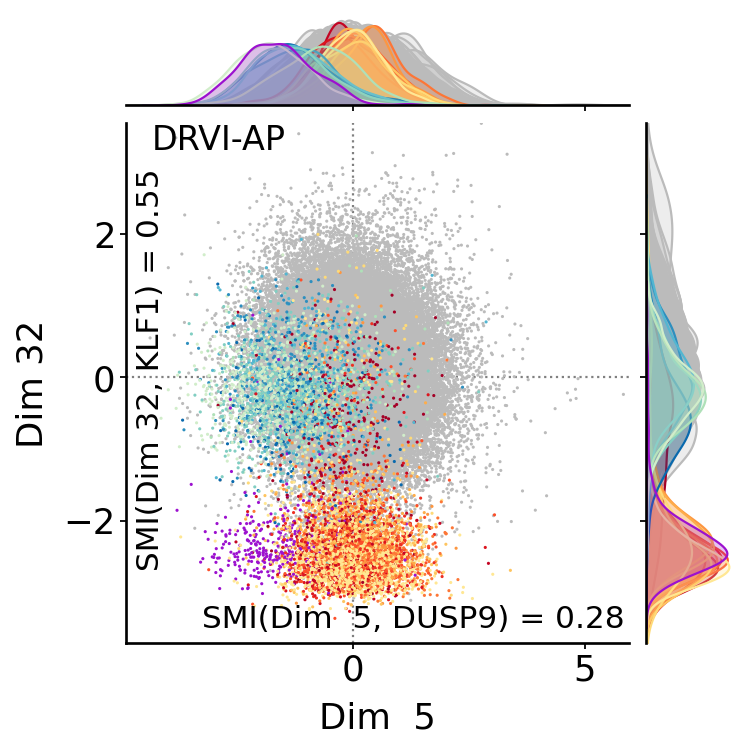

End of latent plots
scVI
plotting Dim 21, Dim 39


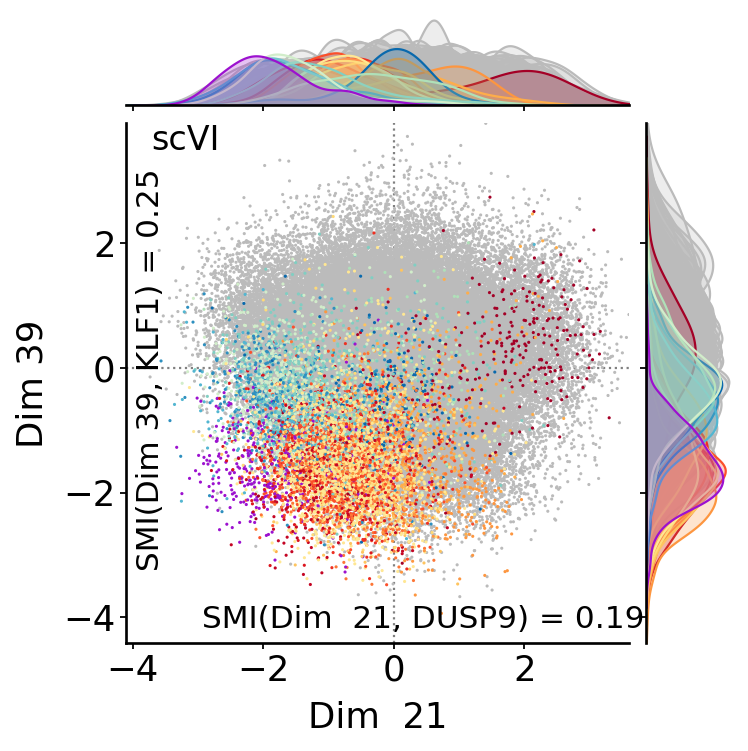

End of latent plots
scVI-PCA
plotting Dim 3, Dim 5


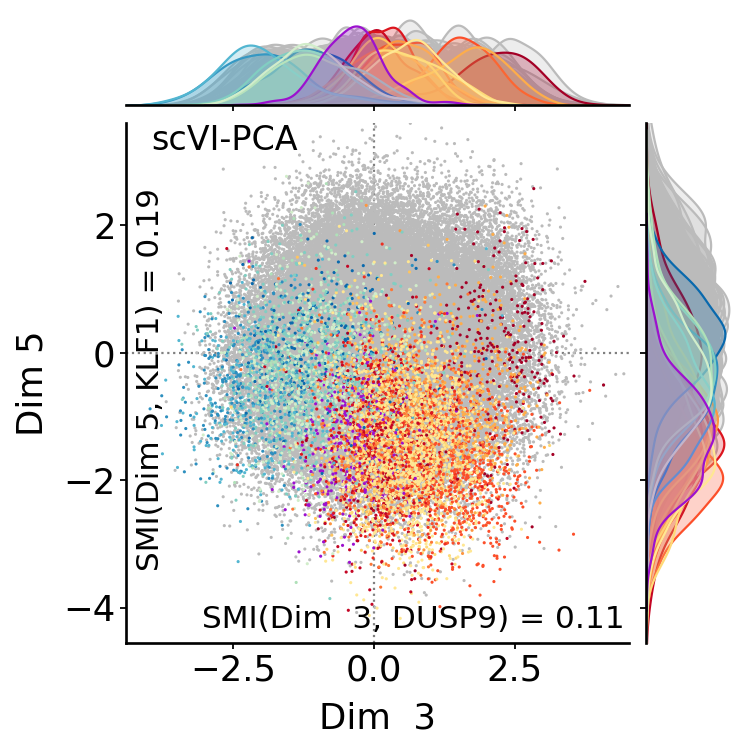

End of latent plots
scVI-ICA
plotting Dim 19, Dim 51


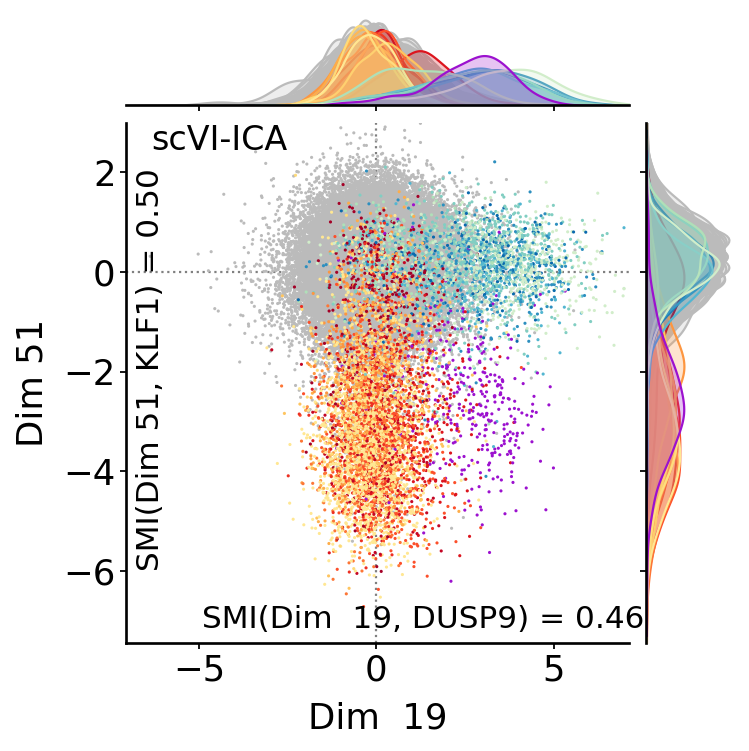

End of latent plots
PCA
plotting Dim 2, Dim 12


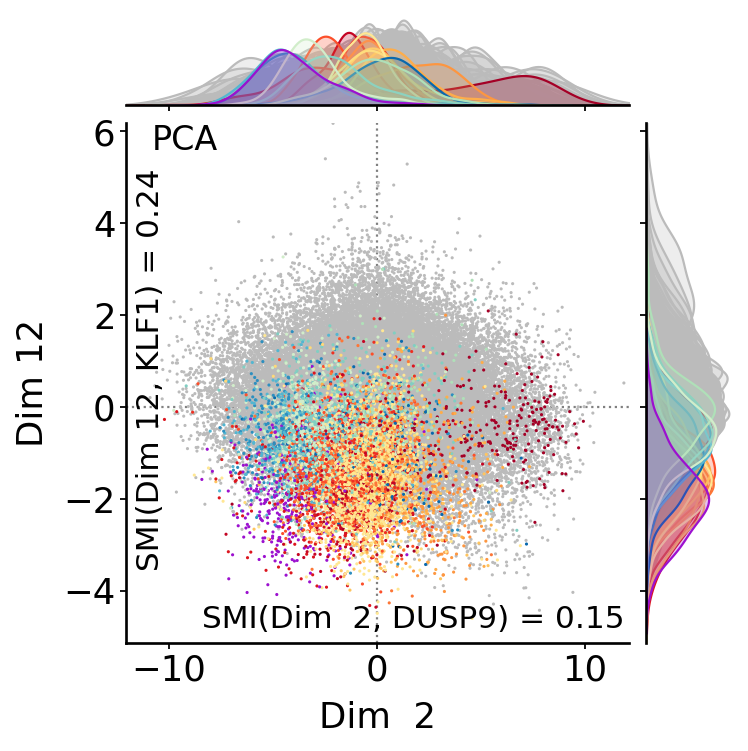

End of latent plots
ICA
plotting Dim 31, Dim 61


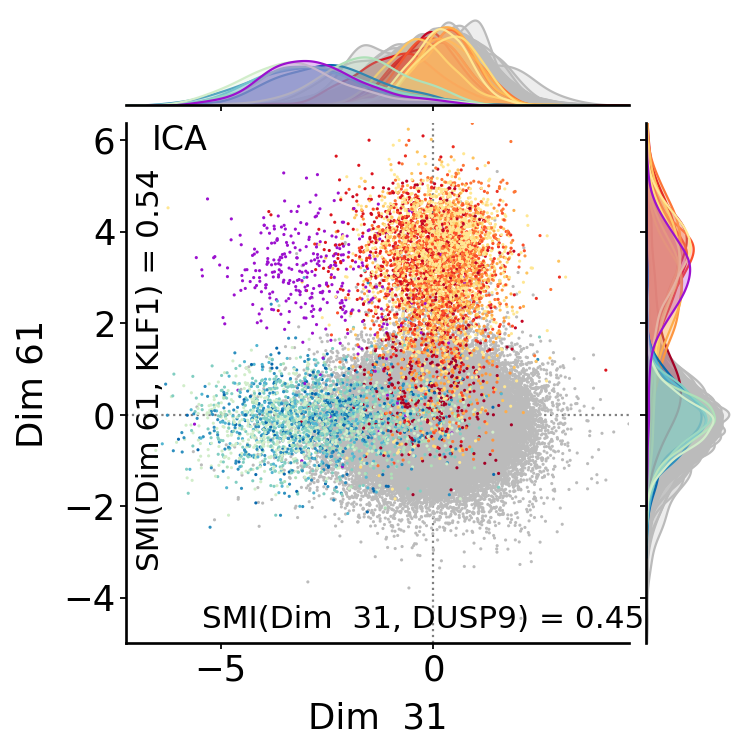

End of latent plots
MOFA
plotting Dim 2, Dim 13


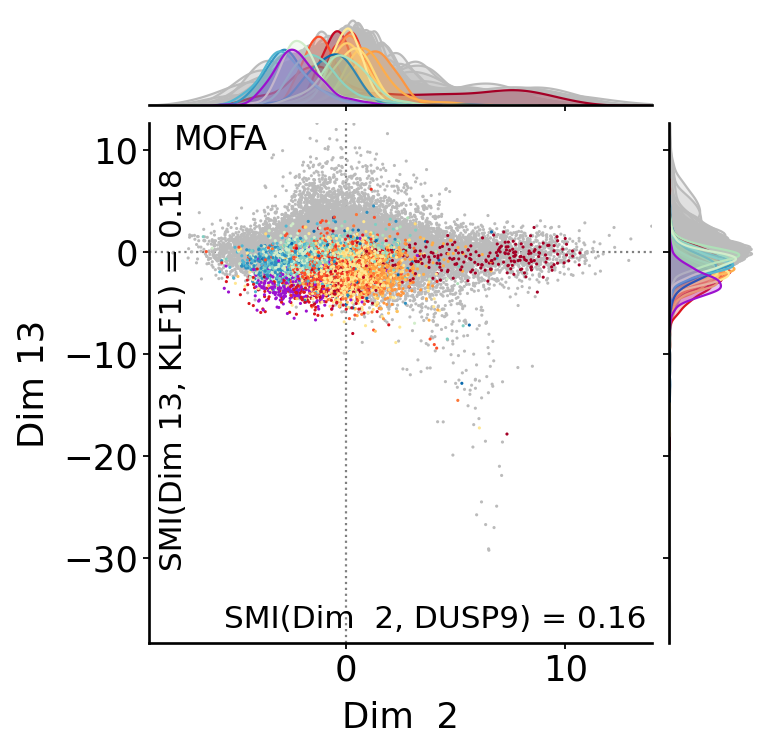

End of latent plots
TCVAE-opt
plotting Dim 58, Dim 31


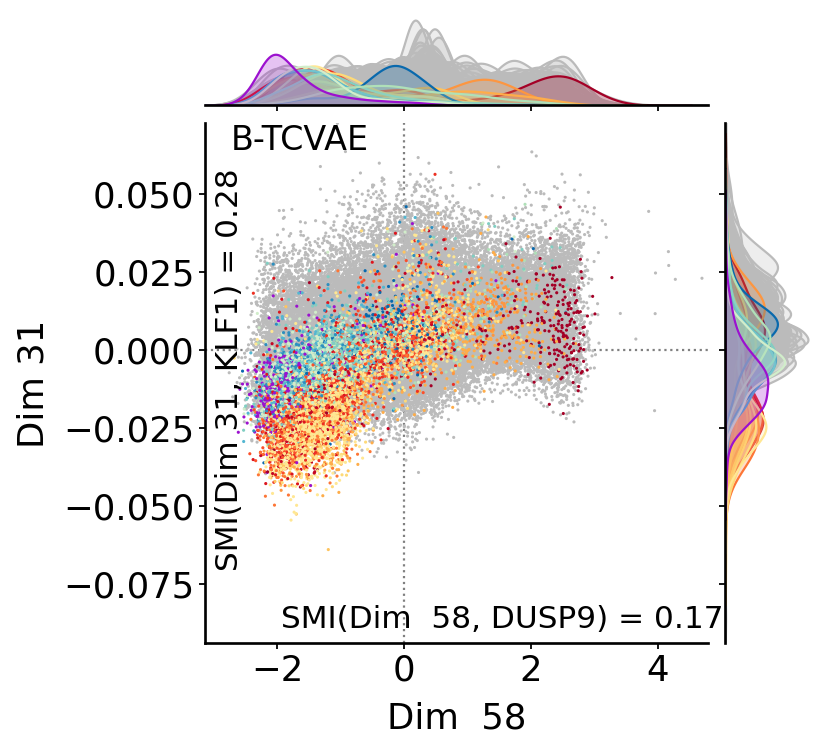

End of latent plots
MICHIGAN-opt
plotting Dim 4, Dim 36


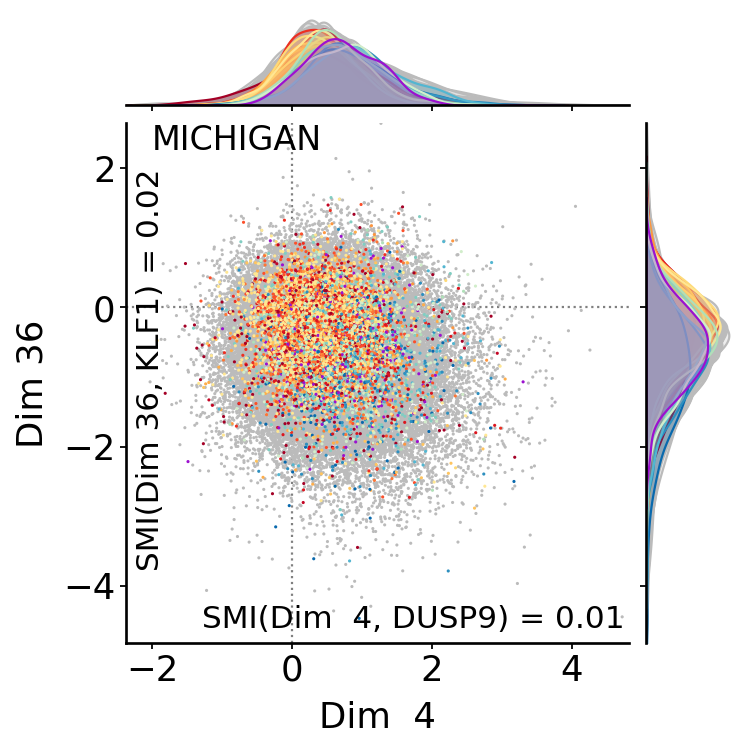

End of latent plots
LIGER
plotting Dim 54, Dim 41


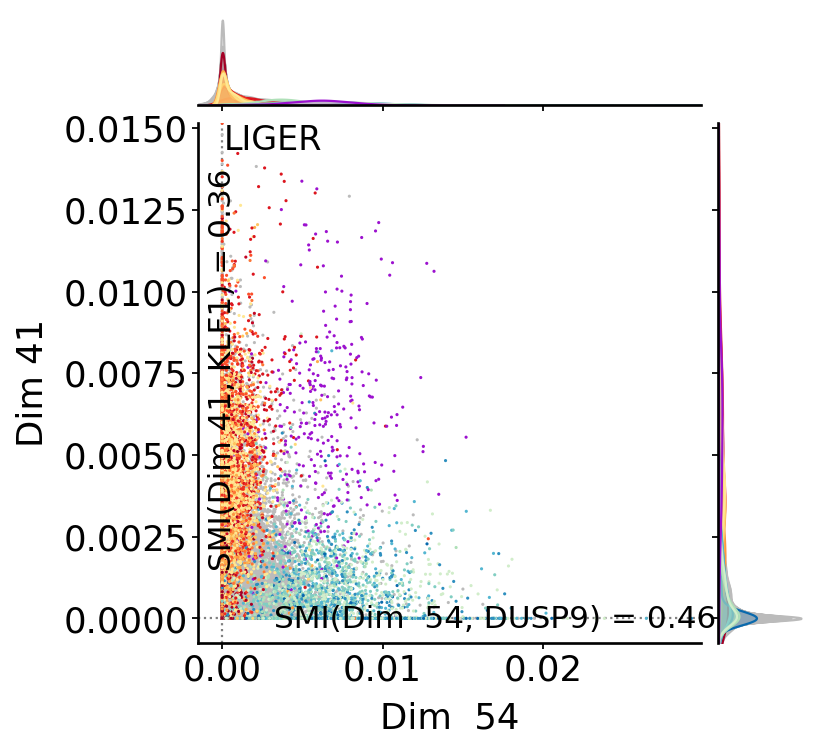

End of latent plots
scETM
plotting Dim 50, Dim 42


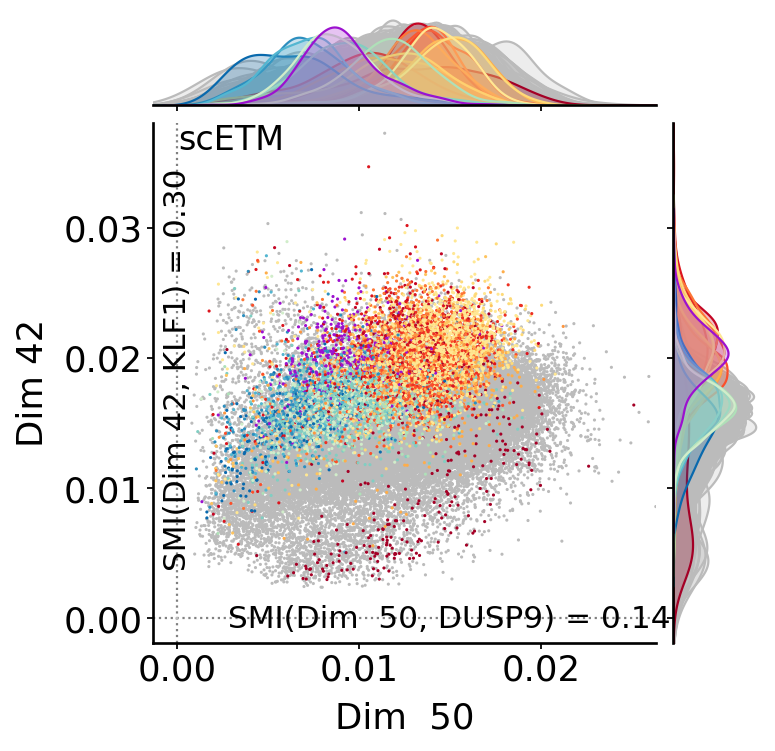

End of latent plots
plotting Dim 50, Dim 42


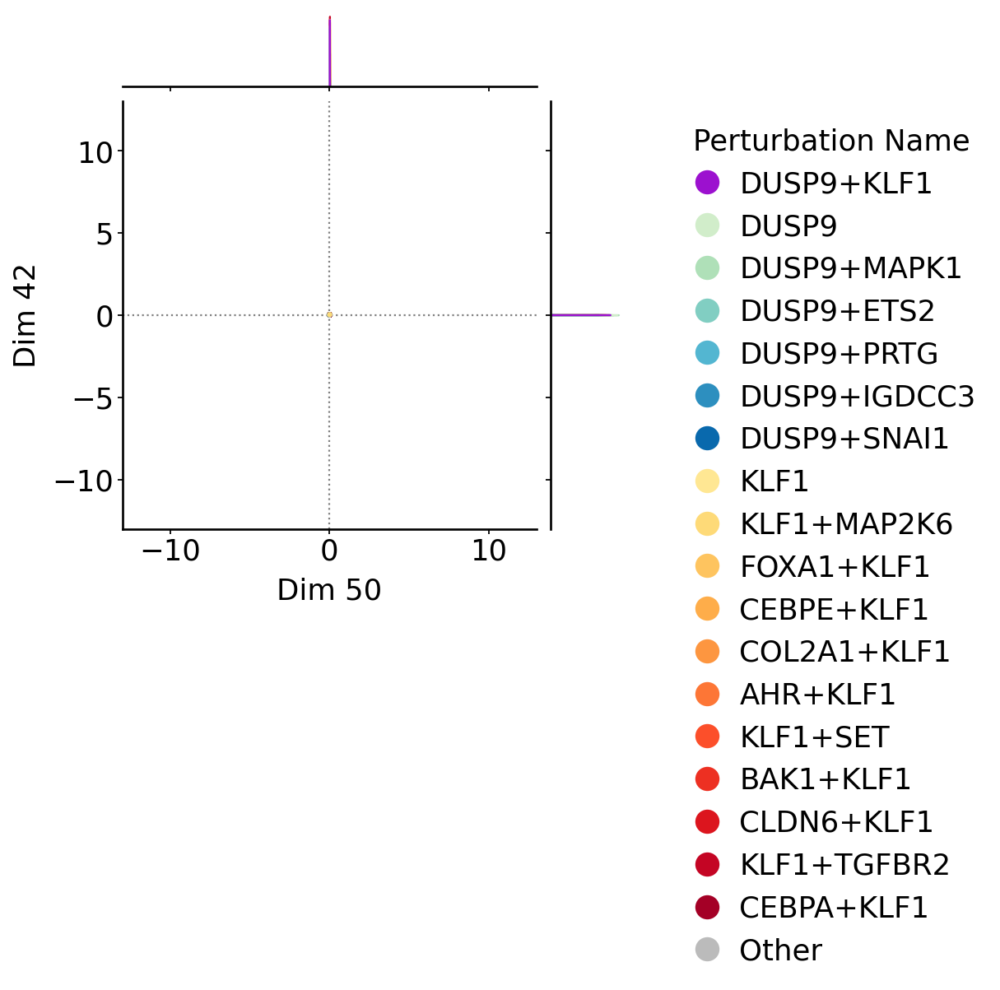

End of latent plots


In [89]:
for (p1, p2) in [
    ('SET', 'KLF1'),
    ('SET', 'DUSP9'),
    ('SET', 'IRF1'),
    ('DUSP9', 'KLF1'),
]:
    if p1 > p2:
        p1, p2 = p2, p1
    p1_cts = list(adata.obs['perturbation_name'][adata.obs['perturbation_name'].str.contains(p1)].unique())
    p1_cts.remove(p1)
    p1_cts.insert(0, p1)
    # the intersection is different
    if f"{p1}+{p2}" in p1_cts:
        p1_cts.remove(f"{p1}+{p2}")
        p1_cts.append(f"{p1}+{p2}")
    
    p2_cts = list(adata.obs['perturbation_name'][adata.obs['perturbation_name'].str.contains(p2)].unique())
    p2_cts.remove(p2)
    p2_cts.insert(0, p2)
    # the intersection is different
    if f"{p1}+{p2}" in p2_cts:
        p2_cts.remove(f"{p1}+{p2}")
        p2_cts.append(f"{p1}+{p2}")
    
    print(" p1_cts", p1_cts, "\n", "p2_cts", p2_cts)

    cmap = matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(-0.1, 1),
                                        cmap=matplotlib.cm.GnBu)
    cmap_2 = matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(-0.1, 1),
                                          cmap=matplotlib.cm.YlOrRd)
    
    color_map_p1 = dict(zip(p1_cts, (
        matplotlib.colors.rgb2hex(c) for c in 
        cmap.to_rgba((np.arange(0, len(p1_cts)) + 1) / len(p1_cts))
    )))
    color_map_p2 = dict(zip(p2_cts, (
        matplotlib.colors.rgb2hex(c) for c in 
        cmap_2.to_rgba((np.arange(0, len(p2_cts)) + 1) / len(p2_cts))
    )))
    color_map_all = {
        **{pn: '#bbbbbb' for pn in list(adata.obs['perturbation_name'].unique())},
        **color_map_p1,
        **color_map_p2,
        **({f"{p1}+{p2}": '#9c11cf'} if f"{p1}+{p2}" in p1_cts else {}),
        'Other': '#bbbbbb'
    }
    color_map_all

    for method_name, embed in embeds.items():
        print(method_name)

        sim_matrix = benchmark_results[method_name]['SMI-disc'].copy()
        row_ind, col_ind = min_weight_full_bipartite_matching(csr_matrix(-sim_matrix[[p1, p2]].values - 1e-10))
        indices_order = np.argsort(col_ind)
        row_ind, col_ind = row_ind[indices_order], col_ind[indices_order]
        row_ind, col_ind
        mi_scores = [sim_matrix[[p1, p2]].iloc[row_ind].values[0, 0],
                     sim_matrix[[p1, p2]].iloc[row_ind].values[1, 1]]
        dim_pair = [row_ind[0], row_ind[1]]
        dim_pair_titles = [f"Dim  {1+dim_pair[0]}", f"Dim {1+dim_pair[1]}"]
        if 'title' in embed.var:
            dim_pair_titles = [embed.var['title'].values[dim_pair[0]], 
                               embed.var['title'].values[dim_pair[1]],]

        def save_fn(fig, dim_i, dim_j, original_col):
            dir_name = output_dir
            dir_name.mkdir(parents=True, exist_ok=True)
            fig.savefig(dir_name / f'fig2_joint_plot_{method_name}_dims_maximizing_{p1}_{p2}.pdf', bbox_inches='tight', dpi=300)
    
        def pp_fn(g):
            g.ax_joint.legend_.remove()
            g.ax_joint.text(0.05, 0.95, pretify_method_name(method_name), size=15, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
            g.ax_joint.text(0.15, 0.03, f"SMI({dim_pair_titles[0]}, {p1}) = {mi_scores[0]:.2f}", size=14, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
            g.ax_joint.text(0.02, 0.15, f"SMI({dim_pair_titles[1]}, {p2}) = {mi_scores[1]:.2f}", size=14, ha='left', color='black', rotation=90, transform=g.ax_joint.transAxes)
            g.ax_joint.set_xlabel(dim_pair_titles[0])
            g.ax_joint.set_ylabel(dim_pair_titles[1])
            
            x_min, x_max = embed.X[:, dim_pair[0]].min(), embed.X[:, dim_pair[0]].max()
            y_min, y_max = embed.X[:, dim_pair[1]].min(), embed.X[:, dim_pair[1]].max()
            g.ax_marg_x.set_xlim(x_min - (x_max - x_min) * 0.05, x_max)
            g.ax_marg_y.set_ylim(y_min - (y_max - y_min) * 0.05, y_max)

            for artist in g.ax_joint.collections:
                artist.set_rasterized(True)
            
            for ax in [g.ax_marg_x, g.ax_marg_y]:
                for artist in ax.collections:
                    artist.set_rasterized(True)
    
        original_params = plt.rcParams.copy()
        set_font_in_rc_params()
        interesting_perts = p1_cts + p2_cts
        # embed.obs['Perturbation Name'] = np.where(
        #     embed.obs['perturbation_name'].isin(interesting_perts),
        #     embed.obs['perturbation_name'],
        #     'Other'
        # )
        embed = embed.copy()
        embed.obs['Perturbation Name'] = embed.obs['perturbation_name']
        embed.obs['top_layer'] = embed.obs['perturbation_name'].isin(p1_cts + p2_cts)
        embed = embed[embed.obs.sort_values('top_layer').index]
        other_perts = [pn for pn in embed.obs['perturbation_name'].unique() if pn not in p1_cts + p2_cts]
        
        plot_per_latent_scatter(embed, ['Perturbation Name'], xy_limit=np.abs(embed.X[:, dim_pair]).max(), 
                                dimensions=[dim_pair], s=2, alpha=1., 
                                predefined_pallete=color_map_all,
                                hue_order=([f"{p1}+{p2}"] if f"{p1}+{p2}" in p1_cts else [])+p1_cts[:-1]+p2_cts[:-1]+other_perts,
                                save_fn=save_fn, 
                                pp_fn=pp_fn, zero_lines=True
                               )
        plt.show()
        plt.rcParams.update(original_params)

    def save_fn(fig, dim_i, dim_j, original_col):
        dir_name = output_dir
        fig.savefig(dir_name / f'fig2_joint_plot_legend_for_dims_maximizing_{p1}_{p2}.pdf', bbox_inches='tight', dpi=300)
    
    embed.obs['Perturbation Name'] = np.where(
        embed.obs['perturbation_name'].isin(interesting_perts),
        embed.obs['perturbation_name'],
        'Other'
    )
    plot_per_latent_scatter(embed, ['Perturbation Name'], xy_limit=13, 
                            dimensions=[dim_pair], s=7, alpha=1., 
                            predefined_pallete=color_map_all,
                            hue_order=([f"{p1}+{p2}"] if f"{p1}+{p2}" in p1_cts else [])+p1_cts[:-1]+p2_cts[:-1]+["Other"],
                            save_fn=save_fn, 
                            zero_lines=True
                           )

## Using pertpy (itself obtained from norman) mode of actions for perts

In [103]:
G1_CYCLE = [
    "CDKN1A",
    ("CDKN1B", "CDKN1A"),
    "CDKN1B",
    ("CDKN1C", "CDKN1A"),
    ("CDKN1C", "CDKN1B"),
    "CDKN1C",
]

ERYTHROID = [
    ("CBL", "CNN1"),
    ("CBL", "PTPN12"),
    ("CBL", "PTPN9"),
    ("CBL", "UBASH3B"),
    ("SAMD1", "PTPN12"),
    ("SAMD1", "UBASH3B"),
    ("UBASH3B", "CNN1"),
    ("UBASH3B", "PTPN12"),
    ("UBASH3B", "PTPN9"),
    ("UBASH3B", "UBASH3A"),
    ("UBASH3B", "ZBTB25"),
    ("BPGM", "SAMD1"),
    "PTPN1",
    ("PTPN12", "PTPN9"),
    ("PTPN12", "UBASH3A"),
    ("PTPN12", "ZBTB25"),
    ("UBASH3A", "CNN1"),
]

PIONEER_FACTORS = [
    ("FOXA1", "FOXF1"),
    ("FOXA1", "FOXL2"),
    ("FOXA1", "HOXB9"),
    ("FOXA3", "FOXA1"),
    ("FOXA3", "FOXF1"),
    ("FOXA3", "FOXL2"),
    ("FOXA3", "HOXB9"),
    "FOXA3",
    ("FOXF1", "FOXL2"),
    ("FOXF1", "HOXB9"),
    ("FOXL2", "MEIS1"),
    "HOXA13",
    "HOXC13",
    ("POU3F2", "FOXL2"),
    "TP73",
    "MIDN",
    ("LYL1", "IER5L"),
    "HOXC13",
    ("DUSP9", "SNAI1"),
    ("ZBTB10", "SNAI1"),
]

GRANULOCYTE_APOPTOSIS = [
    "SPI1",
    "CEBPA",
    ("CEBPB", "CEBPA"),
    "CEBPB",
    ("CEBPE", "CEBPA"),
    ("CEBPE", "CEBPB"),
    ("CEBPE", "RUNX1T1"),
    ("CEBPE", "SPI1"),
    "CEBPE",
    ("ETS2", "CEBPE"),
    ("KLF1", "CEBPA"),
    ("FOSB", "CEBPB"),
    ("FOSB", "CEBPE"),
    ("ZC3HAV1", "CEBPA"),
    ("JUN", "CEBPA"),
]

PRO_GROWTH = [
    ("CEBPE", "KLF1"),
    "KLF1",
    ("KLF1", "BAK1"),
    ("KLF1", "MAP2K6"),
    ("KLF1", "TGFBR2"),
    "ELMSAN1",
    ("MAP2K3", "SLC38A2"),
    ("MAP2K3", "ELMSAN1"),
    "MAP2K3",
    ("MAP2K3", "MAP2K6"),
    ("MAP2K6", "ELMSAN1"),
    "MAP2K6",
    ("MAP2K6", "KLF1"),
]

MEGAKARYOCYTE = [
    ("MAPK1", "TGFBR2"),
    "MAPK1",
    ("ETS2", "MAPK1"),
    "ETS2",
    ("CEBPB", "MAPK1"),
]

programs = {
    "G1 cell cycle": G1_CYCLE,
    "Erythroid": ERYTHROID,
    "Pioneer factors": PIONEER_FACTORS,
    "Granulocyte apoptosis": GRANULOCYTE_APOPTOSIS,
    "Pro-growth": PRO_GROWTH,
    "Megakaryocyte": MEGAKARYOCYTE,
}

In [109]:
reverse_prog_mapping = dict(sum([
    [(pert, prog_name)] if isinstance(pert, str) else [(f"{pert[0]}+{pert[1]}", prog_name), (f"{pert[1]}+{pert[0]}", prog_name)]
    for prog_name, prog in programs.items()
    for pert in prog
], []))

In [110]:
reverse_prog_mapping

{'CDKN1A': 'G1 cell cycle',
 'CDKN1B+CDKN1A': 'G1 cell cycle',
 'CDKN1A+CDKN1B': 'G1 cell cycle',
 'CDKN1B': 'G1 cell cycle',
 'CDKN1C+CDKN1A': 'G1 cell cycle',
 'CDKN1A+CDKN1C': 'G1 cell cycle',
 'CDKN1C+CDKN1B': 'G1 cell cycle',
 'CDKN1B+CDKN1C': 'G1 cell cycle',
 'CDKN1C': 'G1 cell cycle',
 'CBL+CNN1': 'Erythroid',
 'CNN1+CBL': 'Erythroid',
 'CBL+PTPN12': 'Erythroid',
 'PTPN12+CBL': 'Erythroid',
 'CBL+PTPN9': 'Erythroid',
 'PTPN9+CBL': 'Erythroid',
 'CBL+UBASH3B': 'Erythroid',
 'UBASH3B+CBL': 'Erythroid',
 'SAMD1+PTPN12': 'Erythroid',
 'PTPN12+SAMD1': 'Erythroid',
 'SAMD1+UBASH3B': 'Erythroid',
 'UBASH3B+SAMD1': 'Erythroid',
 'UBASH3B+CNN1': 'Erythroid',
 'CNN1+UBASH3B': 'Erythroid',
 'UBASH3B+PTPN12': 'Erythroid',
 'PTPN12+UBASH3B': 'Erythroid',
 'UBASH3B+PTPN9': 'Erythroid',
 'PTPN9+UBASH3B': 'Erythroid',
 'UBASH3B+UBASH3A': 'Erythroid',
 'UBASH3A+UBASH3B': 'Erythroid',
 'UBASH3B+ZBTB25': 'Erythroid',
 'ZBTB25+UBASH3B': 'Erythroid',
 'BPGM+SAMD1': 'Erythroid',
 'SAMD1+BPGM': 'Eryt

In [111]:
adata.obs['pert_group'] = adata.obs['perturbation_name'].map(reverse_prog_mapping)
adata.obs[['perturbation_name', 'pert_group']]

,perturbation_name,pert_group
index,,
AAACCTGAGAAGAAGC-1,control,NaN
AAACCTGAGGCATGTG-1,TSC22D1,NaN
AAACCTGAGGCCCTTG-1,KLF1+MAP2K6,Pro-growth
AAACCTGCACGAAGCA-1,control,NaN
AAACCTGCAGACGTAG-1,CEBPE+RUNX1T1,Granulocyte apoptosis
...,...,...
TTTGTCATCAGTACGT-8,FOXA3,Pioneer factors
TTTGTCATCCACTCCA-8,CELF2,NaN
TTTGTCATCCCAACGG-8,BCORL1,NaN


As we see below, DRVI signatures are more fine grained and does capture what is previously known

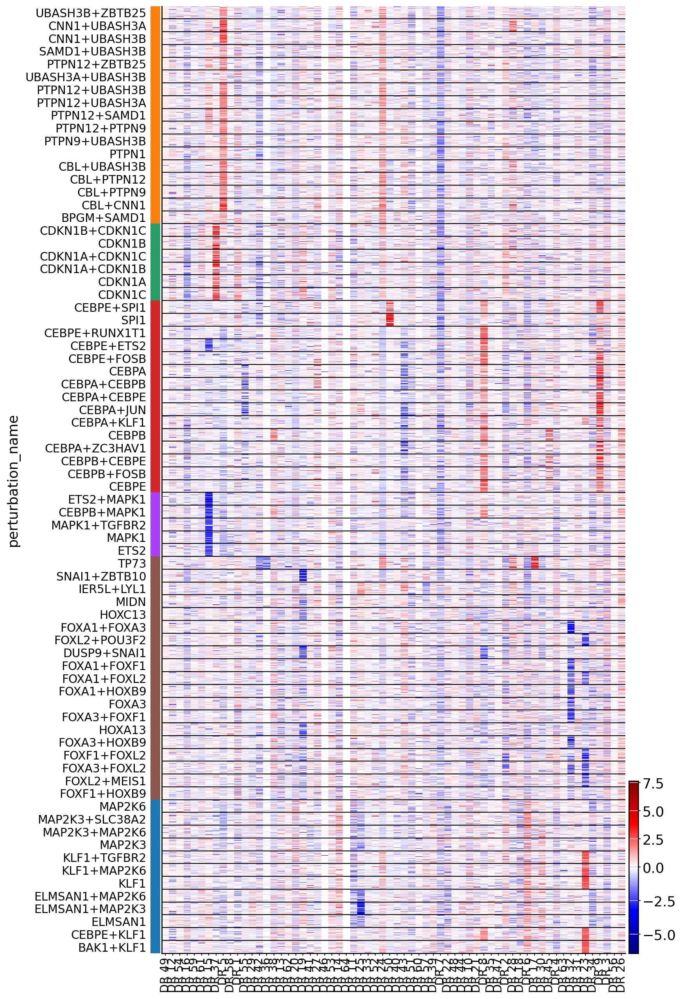

In [132]:
embed = embed_drvi
embed.obs['pert_group'] = adata[embed.obs.index].obs['pert_group']
method_embed_subset = embed[~(embed.obs['pert_group'].isna())]
method_embed_subset = drvi.utils.pl.make_balanced_subsample(method_embed_subset, 'perturbation_name', min_count=20)

pert_color_map = dict(zip(method_embed_subset.obs['pert_group'].unique().tolist(), cat_10_pallete))
method_embed_subset.obs['pert_color'] = method_embed_subset.obs['pert_group'].map(pert_color_map)
unique_info_df = method_embed_subset.obs[['pert_group', 'perturbation_name', 'pert_color']].drop_duplicates(['pert_group', 'perturbation_name', 'pert_color']).sort_values('pert_group')
pert_order = unique_info_df['perturbation_name'].tolist()
pert_color = unique_info_df['pert_color'].tolist()

method_embed_subset.obs['perturbation_name'] = method_embed_subset.obs['perturbation_name'].cat.reorder_categories(pert_order, ordered=True)
method_embed_subset.uns['perturbation_name_colors'] = pert_color

fig = sc.pl.heatmap(
    method_embed_subset,
    method_embed_subset.var['title'],
    'perturbation_name',
    gene_symbols = 'title',
    layer=None,
    figsize=(10, 20),
    show_gene_labels=True,
    dendrogram=False,
    vcenter=0,
    cmap=drvi.utils.pl.cmap.saturated_red_blue_cmap, show=False,
    # swap_axes=True,
)